In [1]:
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from keras.preprocessing.image import load_img,img_to_array

In [2]:
imgs_path = "datathon/"
img_width, img_height = 224, 224
files = [imgs_path + x for x in os.listdir(imgs_path) if x.endswith((".jpg", ".png"))]
print("Total number of images in dataset:",len(files))

Total number of images in dataset: 981


In [3]:
from oml.const import CKPT_SAVE_ROOT as CKPT_DIR, MOCK_DATASET_PATH as DATA_DIR
from oml.models import ViTExtractor
from oml.registry.transforms import get_transforms_for_pretrained

model = ViTExtractor.from_pretrained("vits16_inshop")
transforms, im_reader = get_transforms_for_pretrained("vits16_inshop")

https://oml.daloroserver.com/download/checkpoints/inshop/vits16_inshop_a76b85.ckpt
Checkpoint is already here.
Prefix <model.model.> was removed from the state dict.


In [4]:
features_imgs = []
for filename in files:
    img = im_reader(filename)  
    img_tensor = transforms(img)
    features = model(img_tensor.unsqueeze(0))
    features = features.detach().numpy()
    features_imgs.append(features)
products_features = np.vstack(features_imgs)
products = pd.DataFrame(products_features, index = files)
print(products.shape)

(981, 384)


# COSINE SIMILARITY

In [5]:
from sklearn.metrics.pairwise import cosine_similarity

cosSimilarities = cosine_similarity(products)
cos_similarities_df = pd.DataFrame(cosSimilarities, index = files, columns = files)
cos_similarities_df.head(10)
def getID(product_path):
    index = product_path.rfind('_')
    index = product_path.rfind('_', 0, index)
    return product_path[:index]
cos_similarities_df
cos_similarities_df.to_csv('cosSimilarities/VIT16.csv')

In [6]:
def retrieve_most_similar_products(given_img, cos_similarities_df, nb_closest_images):
    print("-----------------------------------------------------------------------")
    product_name = getID(given_img)
    print("original product:", product_name)
    
    original = load_img(given_img, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("-----------------------------------------------------------------------")
    print("most similar products:")
    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+100].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+100]
    showed_products = []
    showed_products.append(product_name)
    i = 0
    while(len(showed_products) != nb_closest_images + 1):
        name = getID(closest_imgs[i])
        if name in showed_products:
            i+=1
            continue
        if os.path.exists(name + "_image_1.jpg"):
            filename = name + "_image_1.jpg"
        elif os.path.exists(name + "_image_1.png"):
            filename = name + "_image_1.png"
        else:
            filename = closest_imgs[i]
        original = load_img(filename, target_size=(img_width, img_height))
        plt.imshow(original)
        plt.show()
        print("name: ", name)
        print("similarity score : ",closest_imgs_scores.iloc[i])
        i+=1
        showed_products.append(name)

-----------------------------------------------------------------------
original product: datathon/test


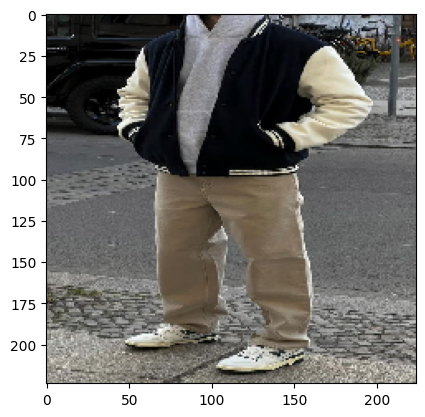

-----------------------------------------------------------------------
most similar products:


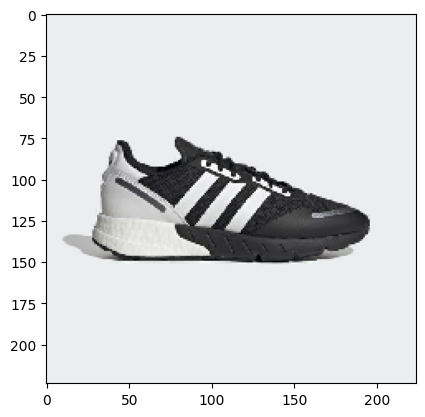

name:  datathon/zx_1k_boost_shoes
similarity score :  0.95254445


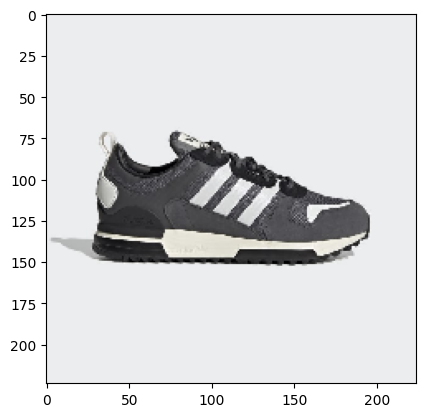

name:  datathon/zx_700_hd_shoes
similarity score :  0.9477227


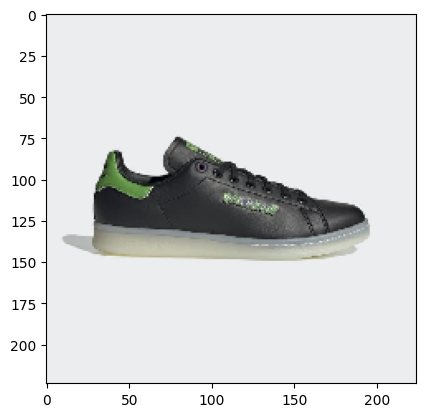

name:  datathon/hulk_stan_smith_shoes
similarity score :  0.9470637


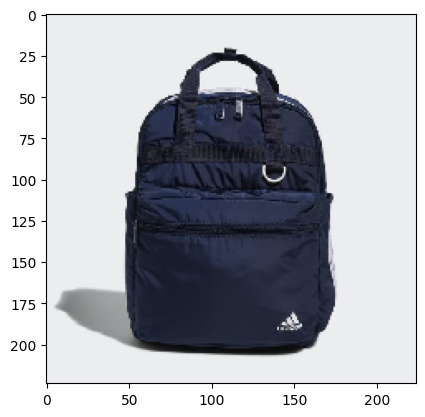

name:  datathon/essentials_backpack
similarity score :  0.9462296


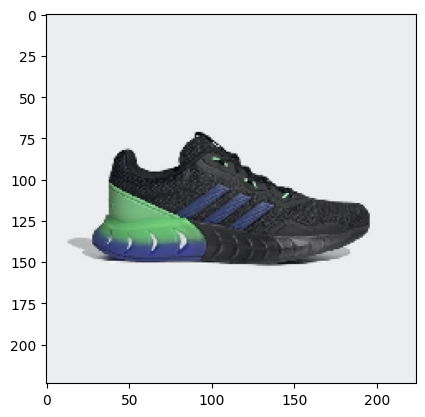

name:  datathon/kaptir_super_shoes
similarity score :  0.9462188


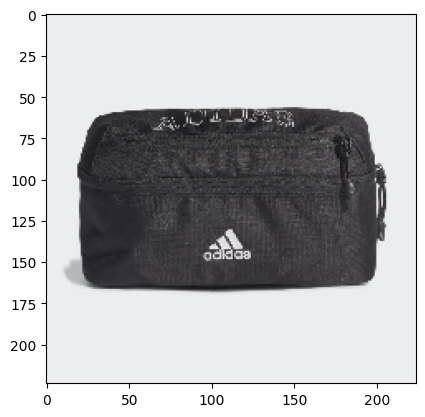

name:  datathon/classic_waist_bag
similarity score :  0.9449789


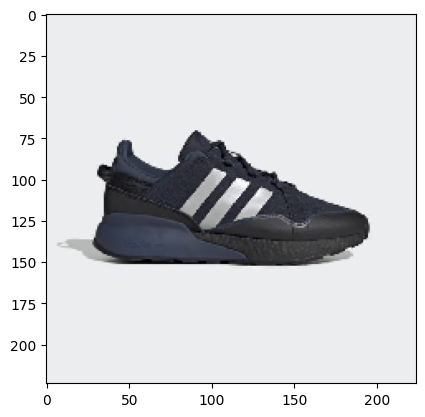

name:  datathon/zx_2k_boost_pure_shoes
similarity score :  0.94497573


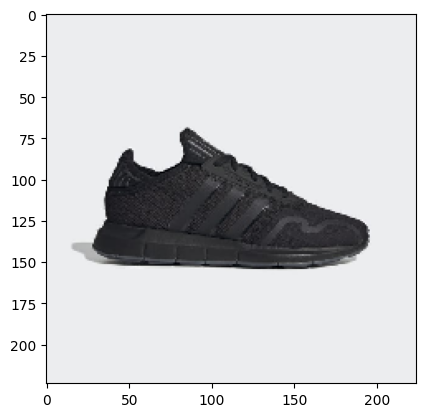

name:  datathon/swift_run_x_shoes
similarity score :  0.944829


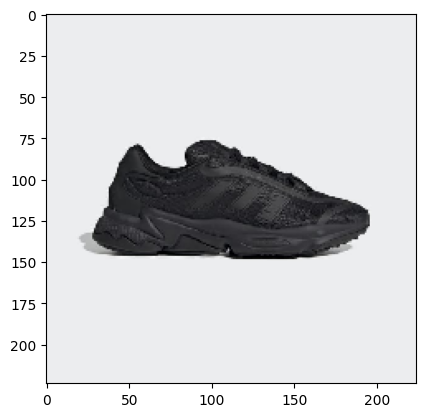

name:  datathon/ozweego_pure_shoes
similarity score :  0.944559


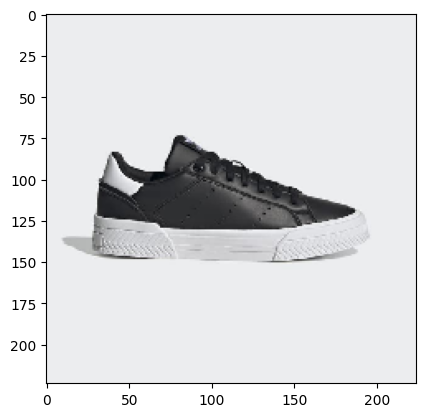

name:  datathon/court_tourino_shoes
similarity score :  0.944378


In [7]:
retrieve_most_similar_products('datathon/test_image_5.jpg', cos_similarities_df, 10)

# GETTING PRODUCTS OF THE USER AND FIND RECOMMENDATIONS

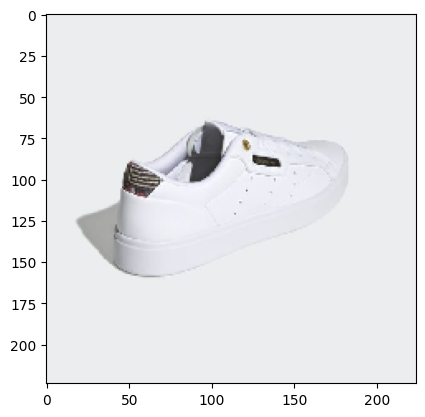

name:  datathon/adidas_sleek_shoes


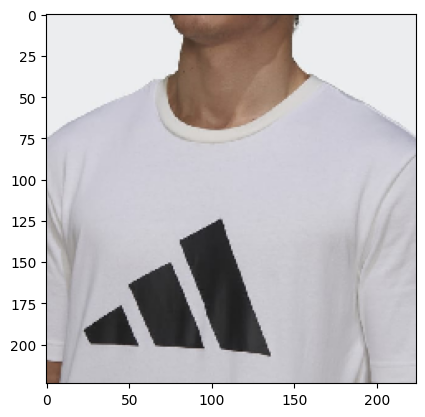

name:  datathon/adidas_sportswear_future_icons_logo_graphic_tee


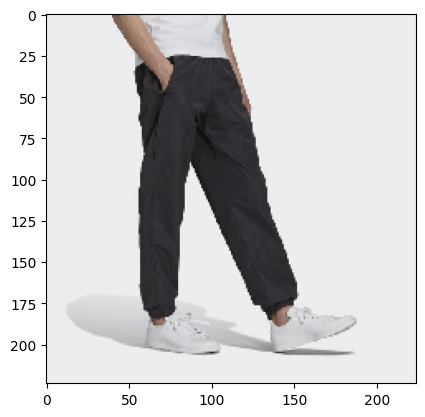

name:  datathon/adicolor_track_pants


In [8]:
item1 = 'datathon/adidas_sleek_shoes_image_5.jpg'
item2 = 'datathon/adidas_sportswear_future_icons_logo_graphic_tee_image_7.jpg'
item3 = 'datathon/adicolor_track_pants_image_3.jpg'
items = [item1, item2, item3]
for item in items:
    name = getID(item)
    original = load_img(item, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
n_recommendations = 50

## BRIDGE REGRESSION 

/Users/pianokill/miniconda3/envs/datathon/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:200: LinAlgWarning: Ill-conditioned matrix (rcond=3.97376e-08): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


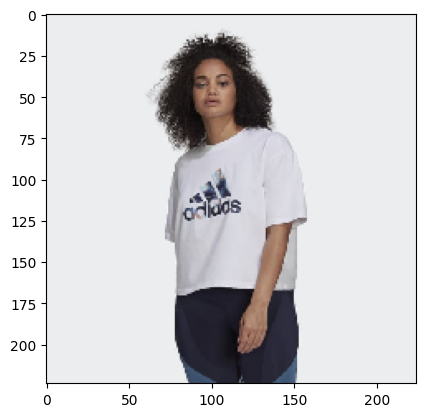

name:  datathon/adidas_x_zoe_saldana_crop_logo_tee_(plus_size)
rating:  0.095921874


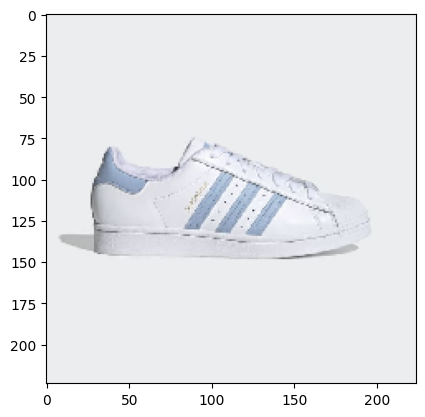

name:  datathon/superstar_shoes
rating:  0.08852762


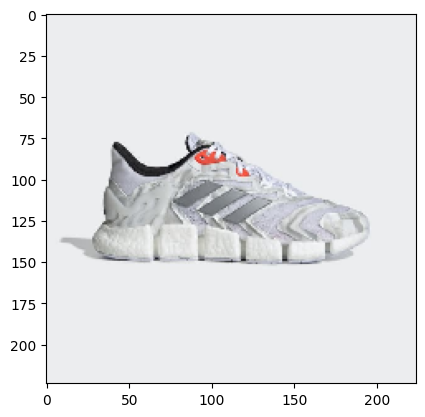

name:  datathon/climacool_vento_shoes
rating:  0.08221215


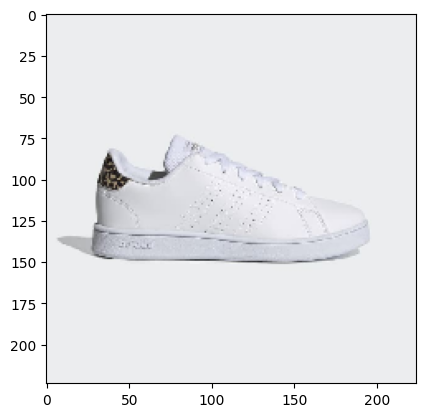

name:  datathon/advantage_shoes
rating:  0.07032654


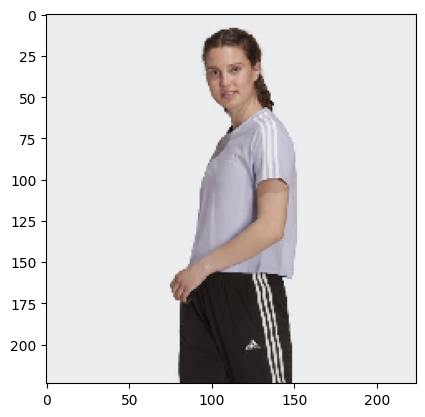

name:  datathon/essentials_loose_3-stripes_cropped_tee
rating:  0.06654602


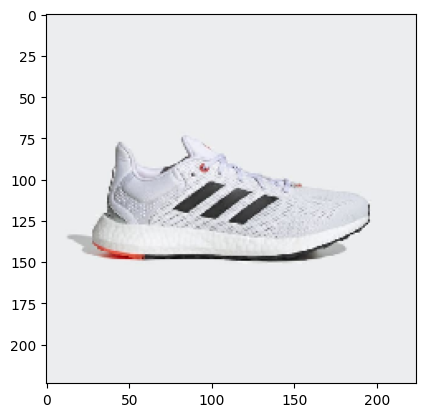

name:  datathon/pureboost_21_shoes
rating:  0.06620455


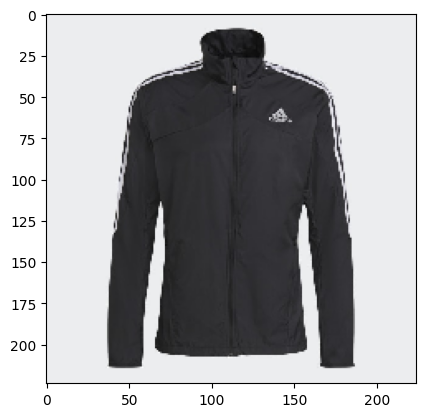

name:  datathon/marathon_3-stripes_jacket
rating:  0.062597156


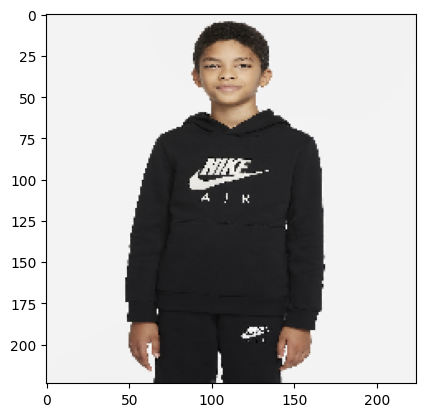

name:  datathon/nike_air
rating:  0.062583506


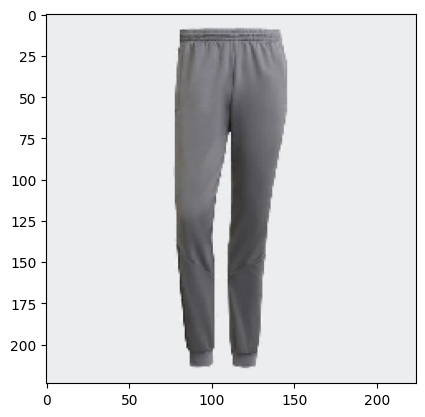

name:  datathon/adidas_sprt_colorblock_track_pants
rating:  0.062003136


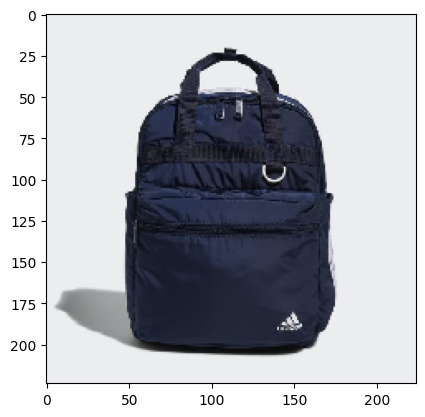

name:  datathon/essentials_backpack
rating:  0.060768843


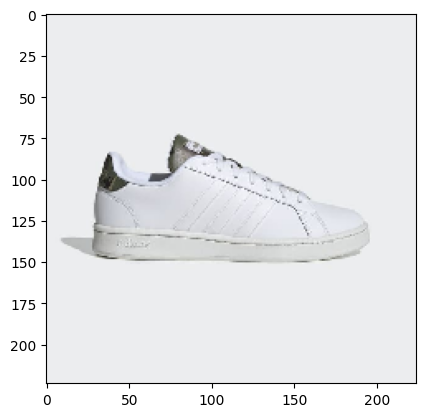

name:  datathon/grand_court_shoes
rating:  0.060166866


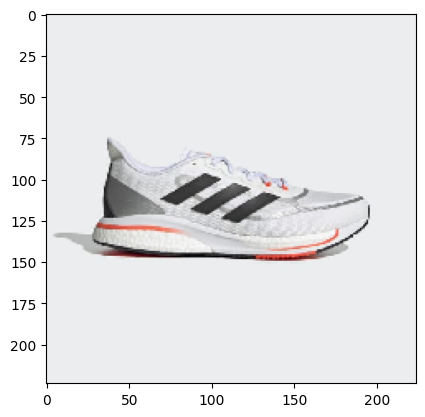

name:  datathon/supernova+_shoes
rating:  0.05866617


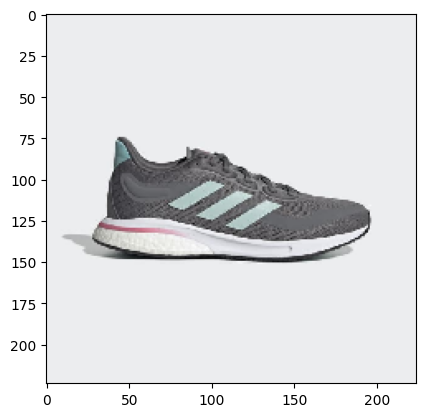

name:  datathon/supernova_shoes
rating:  0.05825889


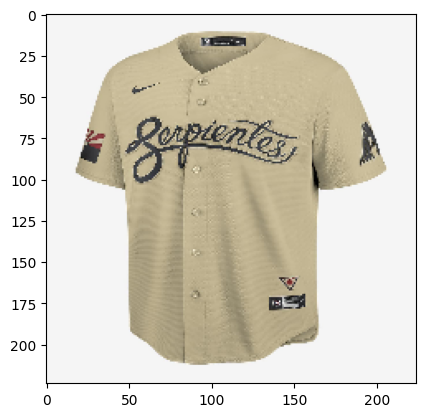

name:  datathon/mlb_arizona_diamondbacks_city_connect
rating:  0.05670762


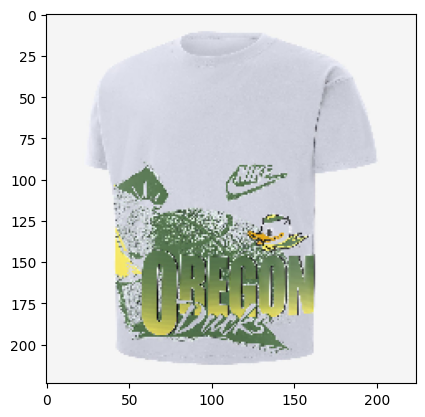

name:  datathon/nike_college_(oregon)
rating:  0.05594176


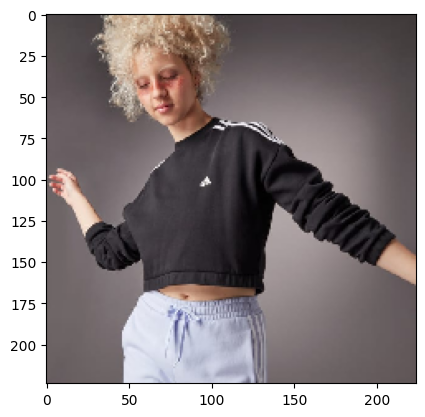

name:  datathon/hyperglam_crop_crew_sweatshirt
rating:  0.055936724


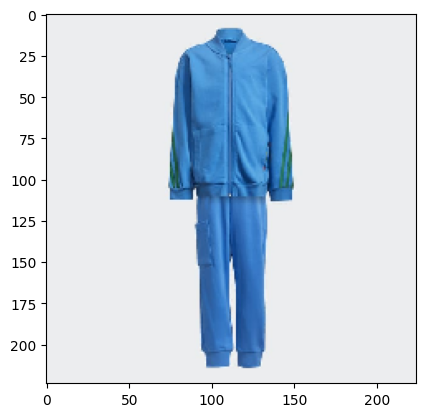

name:  datathon/adidas_x_classic_lego¨_track_suit
rating:  0.055753678


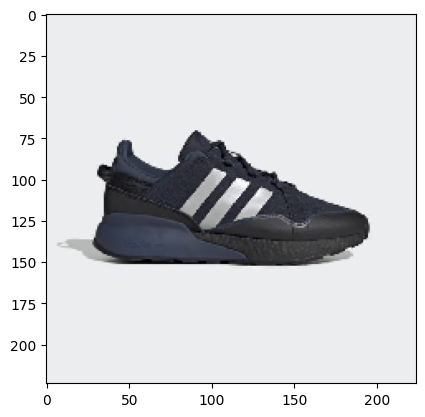

name:  datathon/zx_2k_boost_pure_shoes
rating:  0.055719137


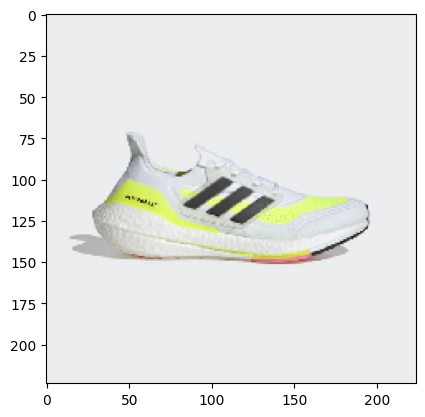

name:  datathon/ultraboost_21_shoes
rating:  0.055033028


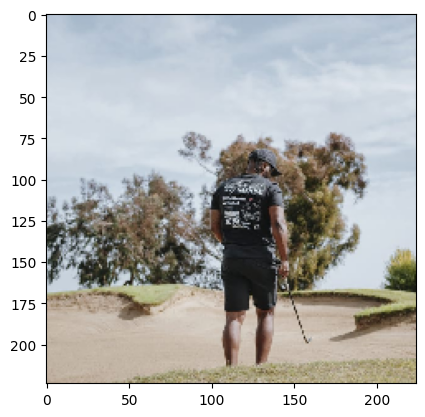

name:  datathon/adicross_hybrid_shorts
rating:  0.05455482


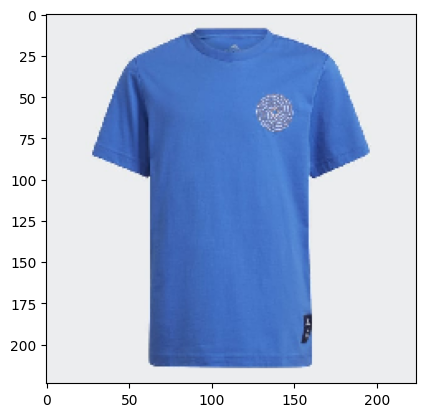

name:  datathon/real_madrid_tee
rating:  0.054361314


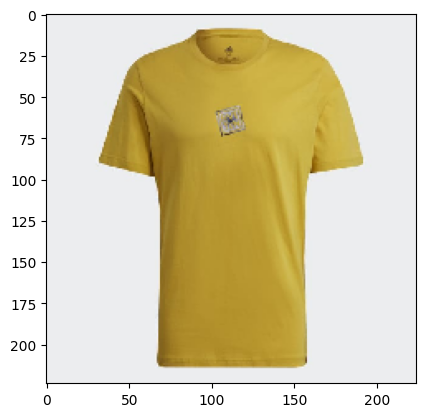

name:  datathon/five_ten_heritage_logo_tee
rating:  0.054281414


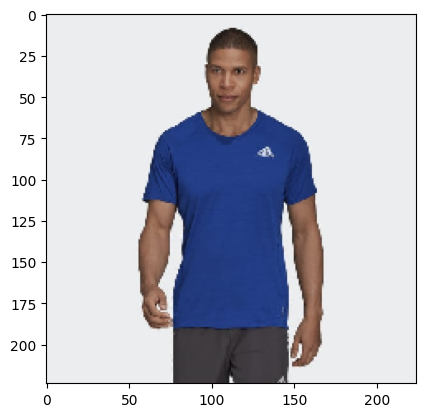

name:  datathon/runner_tee
rating:  0.052995145


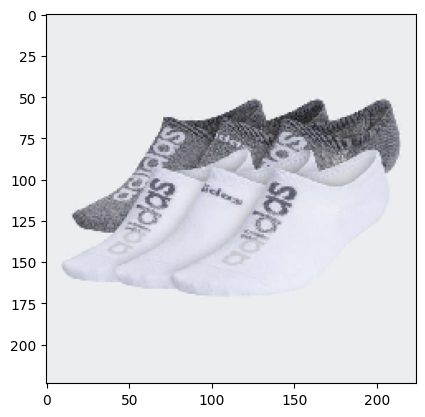

name:  datathon/linear_superlite_super-no-show_socks_6_pairs
rating:  0.052885294


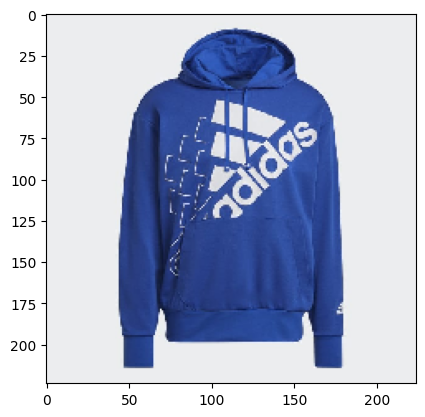

name:  datathon/essentials_logo_hoodie_(gender_neutral)
rating:  0.051660895


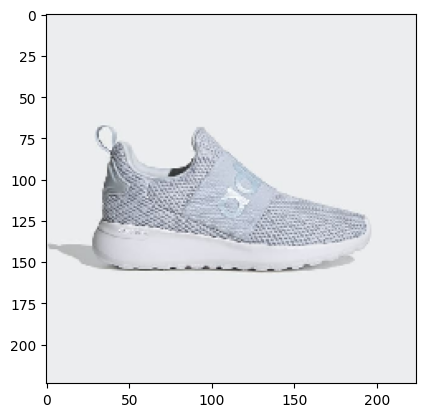

name:  datathon/lite_racer_adapt_4.0_shoes
rating:  0.05131638


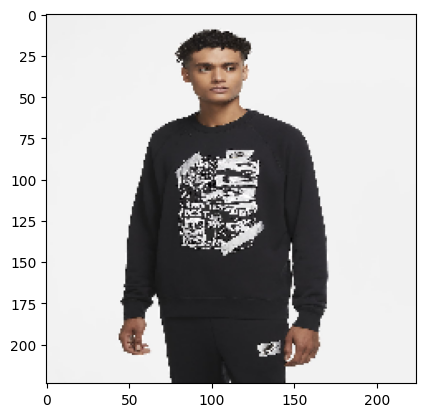

name:  datathon/nike_sportswear
rating:  0.050453037


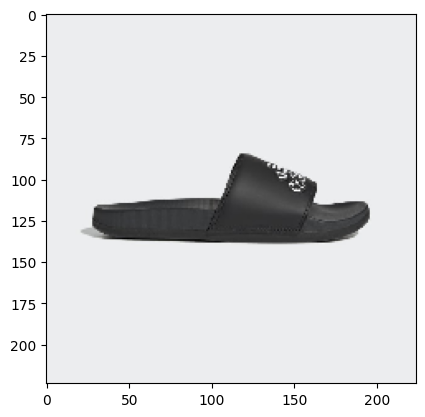

name:  datathon/adilette_comfort_slides
rating:  0.050103664


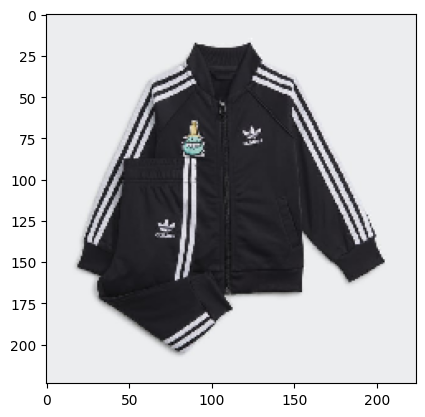

name:  datathon/originals_x_kevin_lyons_sst_set
rating:  0.049390823


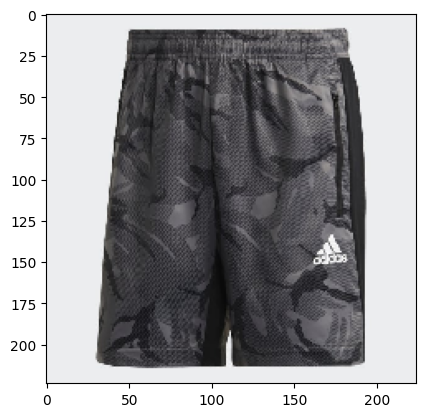

name:  datathon/aeroready__designed_to_move_sport_camo-print_shorts
rating:  0.048714995


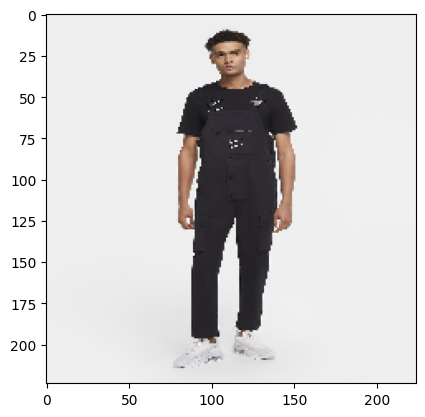

name:  datathon/nike_sportswear_swoosh
rating:  0.04837045


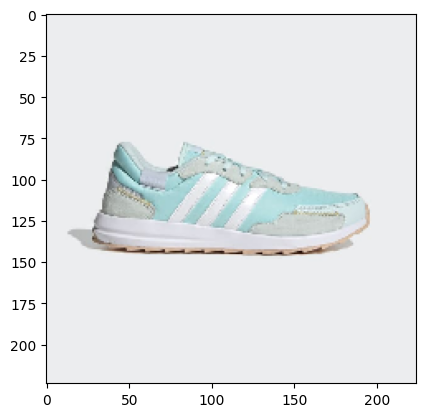

name:  datathon/retrorun_shoes
rating:  0.048323393


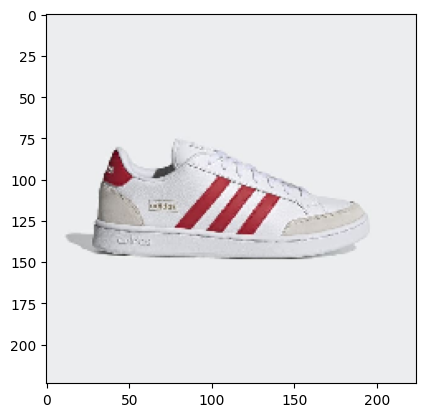

name:  datathon/grand_court_se_shoes
rating:  0.04815793


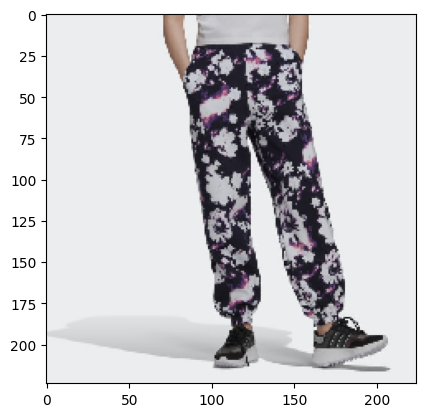

name:  datathon/track_pants
rating:  0.048013


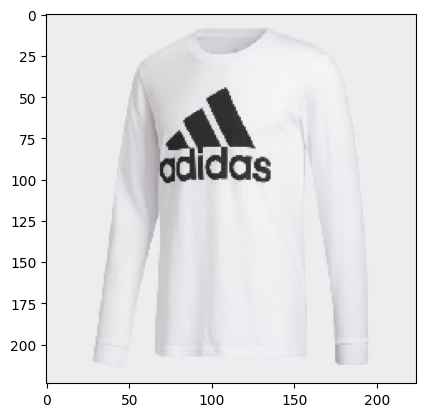

name:  datathon/badge_of_sport_tee
rating:  0.047849834


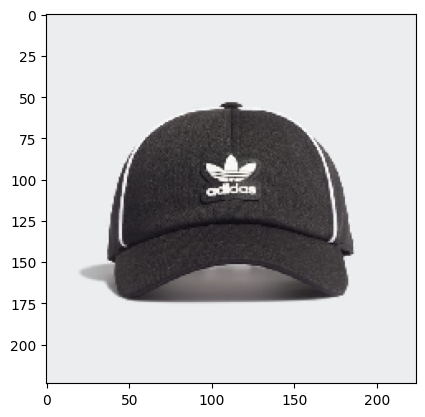

name:  datathon/adicolor_collegiate_baseball_cap
rating:  0.04779622


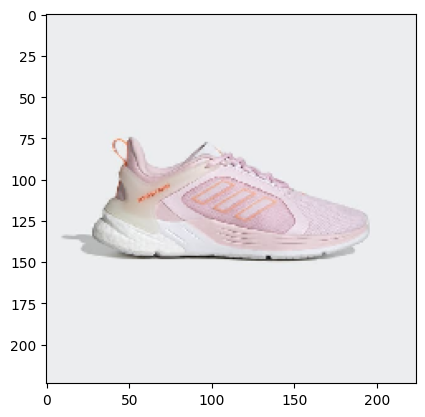

name:  datathon/response_super_2.0_shoes
rating:  0.047546715


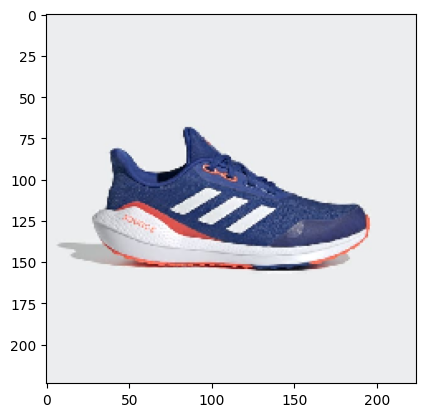

name:  datathon/eq21_run_shoes
rating:  0.047213912


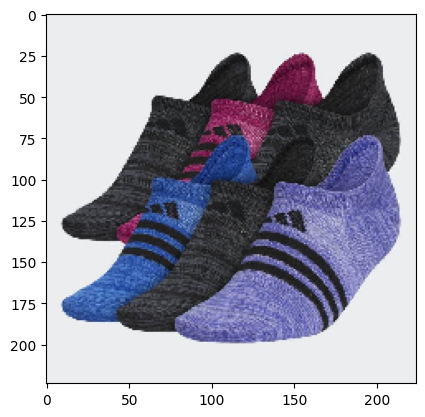

name:  datathon/superlite_super-no-show_socks_6_pairs
rating:  0.04679835


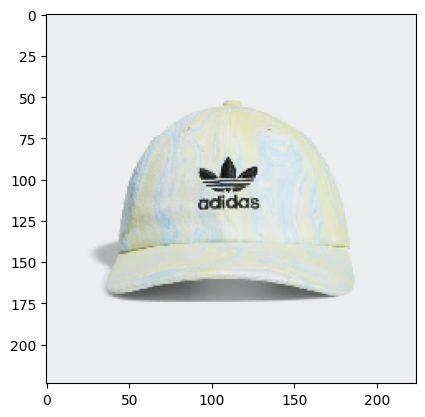

name:  datathon/relaxed_marble_wash_hat
rating:  0.046129644


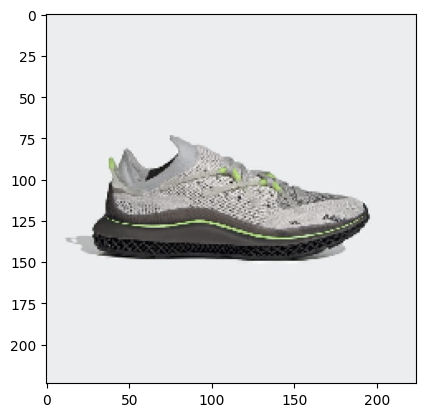

name:  datathon/4d_fusio_shoes
rating:  0.045920193


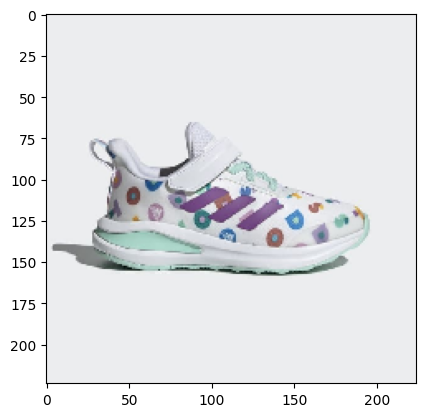

name:  datathon/adidas_fortarun_x_lego¨_dotsª_shoes
rating:  0.04543239


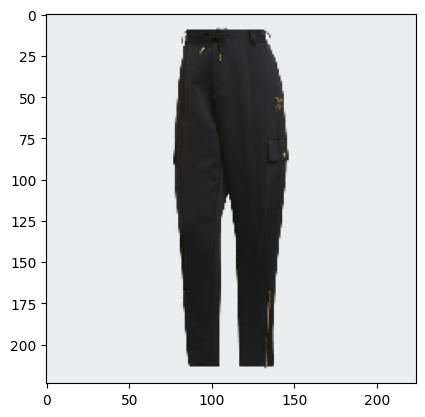

name:  datathon/cargo_pants
rating:  0.0450508


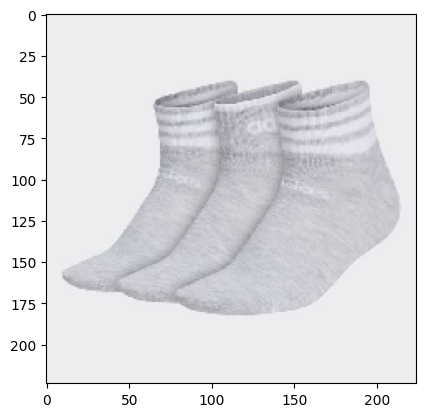

name:  datathon/3-stripes_low_cut_socks_3_pairs
rating:  0.043946087


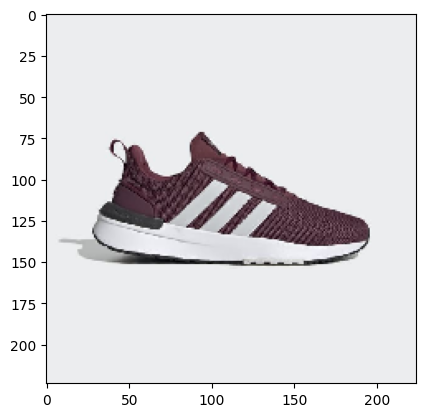

name:  datathon/racer_tr21_shoes
rating:  0.04371822


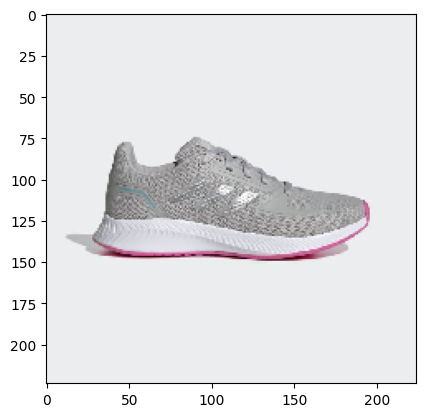

name:  datathon/runfalcon_2.0_shoes
rating:  0.043455005


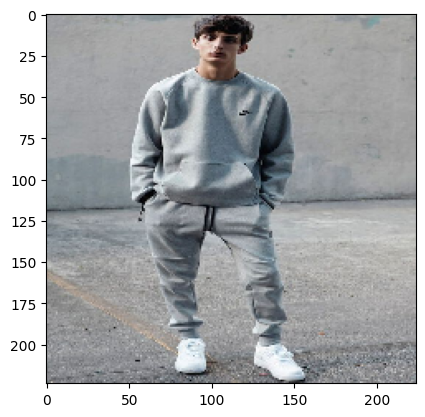

name:  datathon/test
rating:  0.04290396


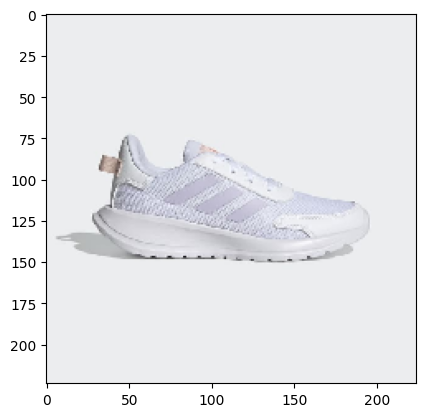

name:  datathon/tensor_run_shoes
rating:  0.042120308


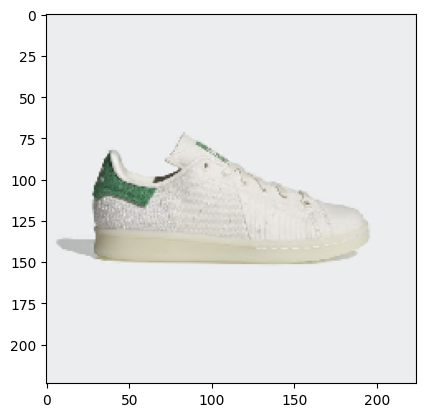

name:  datathon/stan_smith_primeblue_shoes
rating:  0.04169506


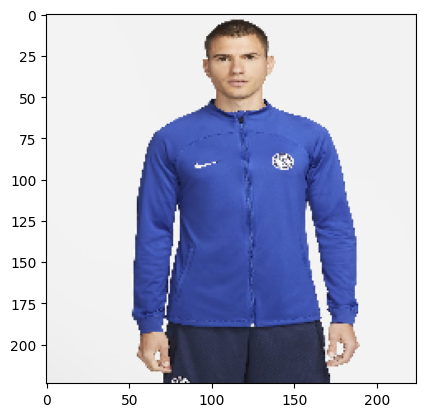

name:  datathon/chelsea_fc_strike
rating:  0.041585088


In [9]:
from sklearn import linear_model

scores = np.zeros(products_features.shape[0])
indices = [products.index.get_loc(idx) for idx in items]
scores[indices] = 1
clf = linear_model.Ridge(alpha=0.01, fit_intercept  = True)
clf.fit(products_features, scores)
w = clf.coef_
b = clf.intercept_
ratings = products_features.dot(w) + b
top_indices = np.argsort(ratings)[::-1]

i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", ratings[top_indices[i]])
    i+=1
    showed_items.append(name)

## AVERAGE FEATURES

In [10]:
indices = [products.index.get_loc(idx) for idx in items]
X = np.zeros(products_features.shape[1])
for index in indices:
    X = products_features[index] + X
X = X/len(indices)
vector_cosine = cosine_similarity(X.reshape(1, -1), products_features)
vector_cosine = vector_cosine.reshape(-1)
top_indices = np.argsort(vector_cosine)[::-1]

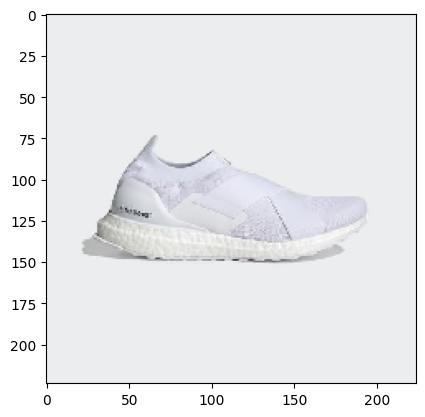

name:  datathon/ultraboost_slip-on_dna_shoes
rating:  0.9734276250203113


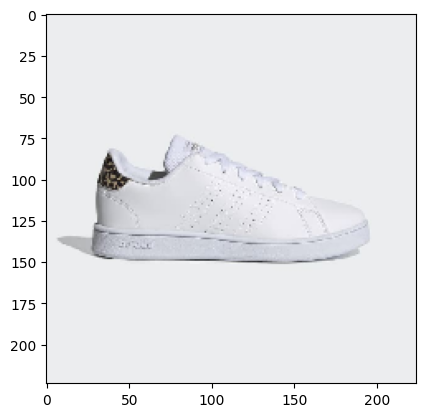

name:  datathon/advantage_shoes
rating:  0.9728112245645701


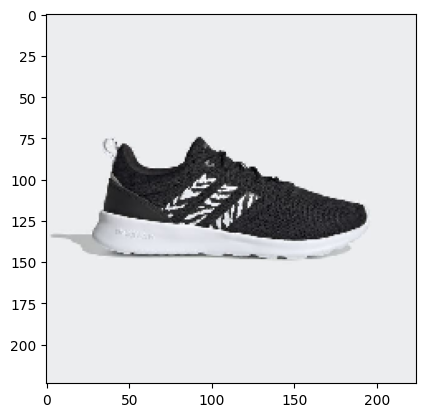

name:  datathon/qt_racer_2.0_shoes
rating:  0.9726122584646265


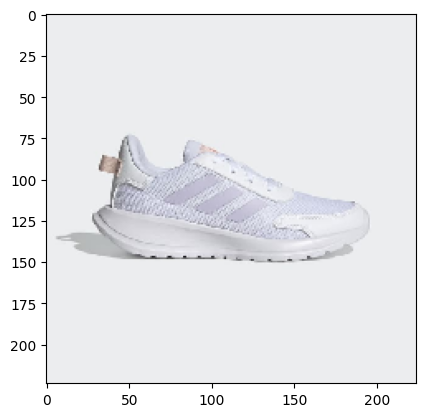

name:  datathon/tensor_run_shoes
rating:  0.9717269109511742


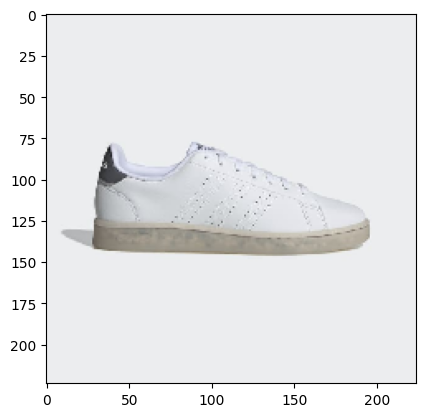

name:  datathon/advantage_eco_shoes
rating:  0.9713019470226381


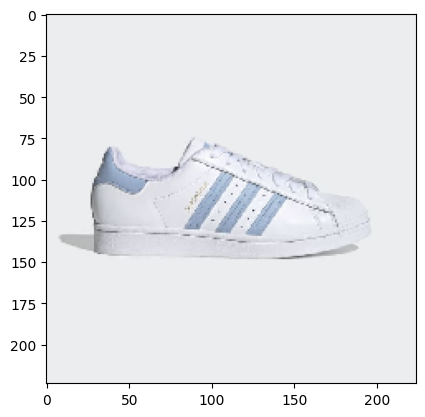

name:  datathon/superstar_shoes
rating:  0.9708944156028628


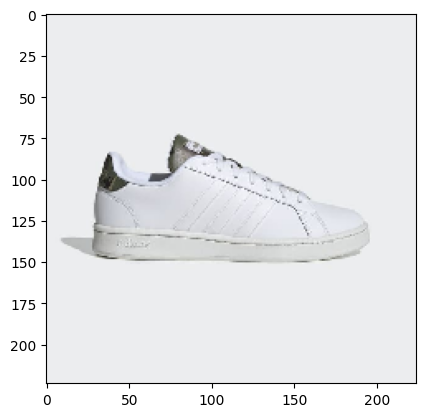

name:  datathon/grand_court_shoes
rating:  0.9708590040681331


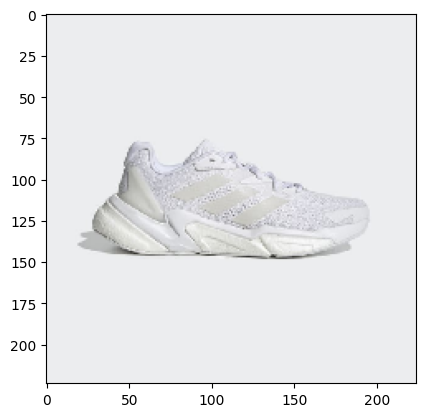

name:  datathon/x9000l3_shoes
rating:  0.9707034987809042


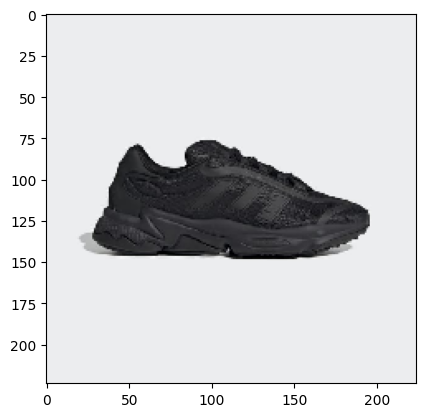

name:  datathon/ozweego_pure_shoes
rating:  0.9705673025821293


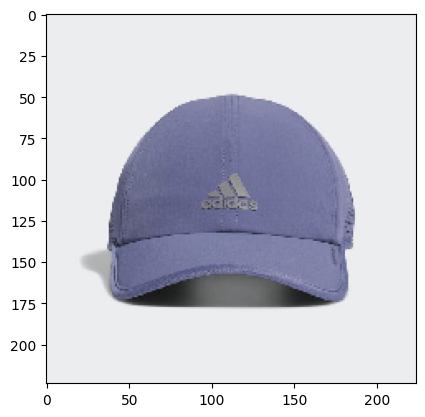

name:  datathon/superlite_hat
rating:  0.9699129723040405


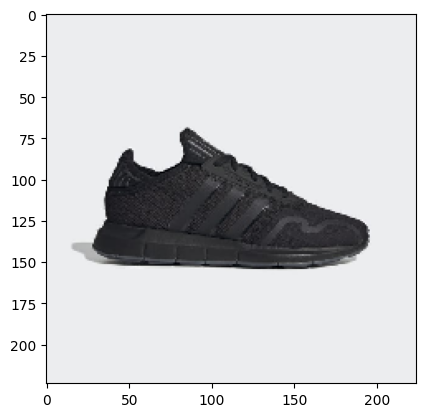

name:  datathon/swift_run_x_shoes
rating:  0.9697292458402904


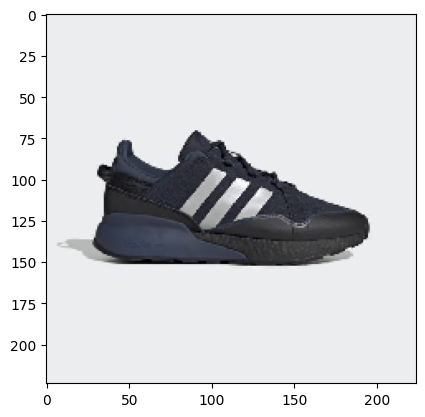

name:  datathon/zx_2k_boost_pure_shoes
rating:  0.9693144673656944


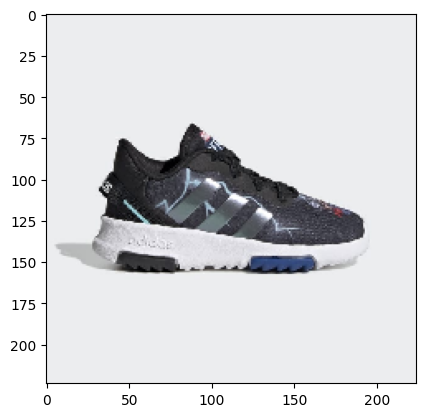

name:  datathon/marvel_superhero_racer_tr_2.0_shoes
rating:  0.9692999446440644


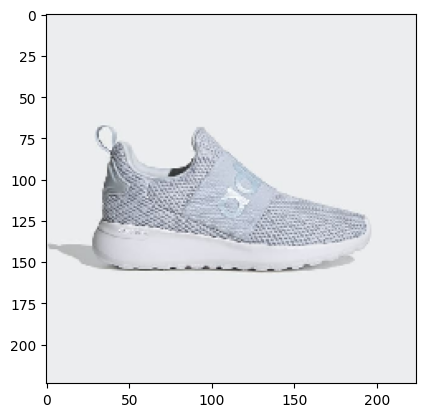

name:  datathon/lite_racer_adapt_4.0_shoes
rating:  0.9690870803361437


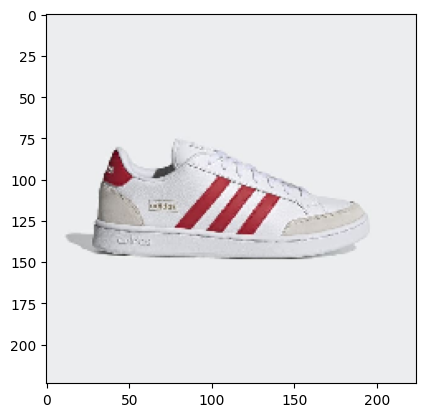

name:  datathon/grand_court_se_shoes
rating:  0.9690734972677


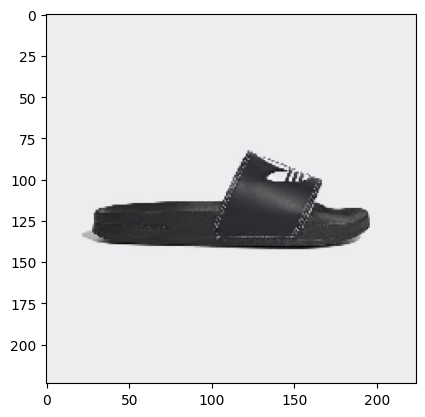

name:  datathon/adilette_lite_slides
rating:  0.9690665637881848


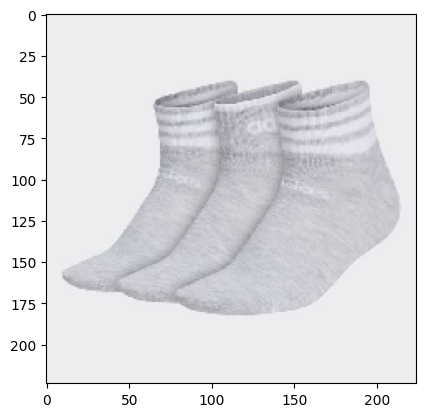

name:  datathon/3-stripes_low_cut_socks_3_pairs
rating:  0.9687823013845133


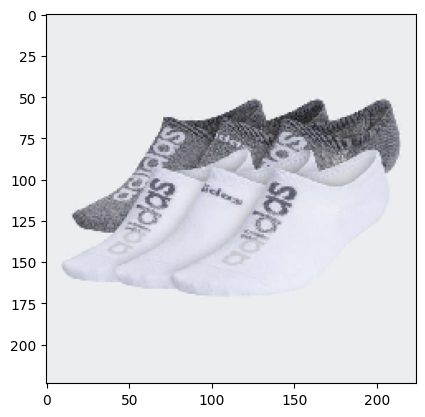

name:  datathon/linear_superlite_super-no-show_socks_6_pairs
rating:  0.9686959370633761


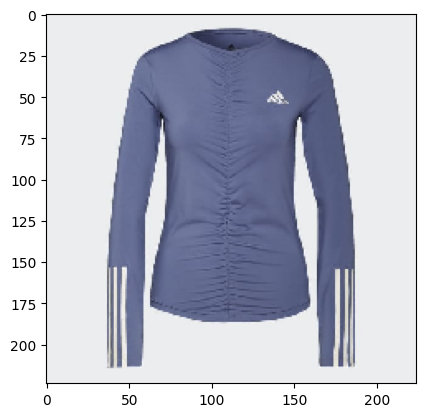

name:  datathon/aeroready_breathable_3-stripes_long_sleeve_tee
rating:  0.9686396033279161


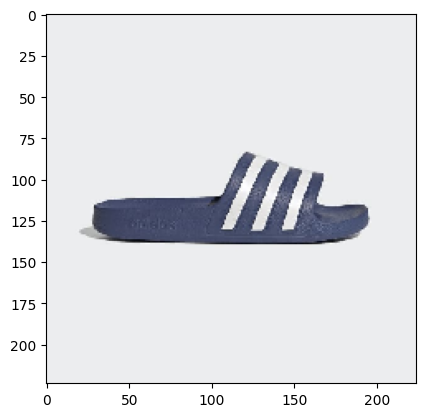

name:  datathon/adilette_aqua_slides
rating:  0.9685067110298436


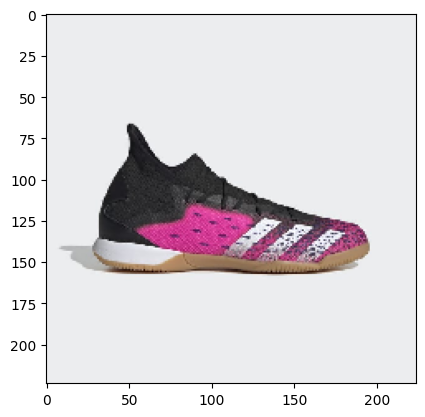

name:  datathon/predator_freak.3_indoor_shoes
rating:  0.9683018602067972


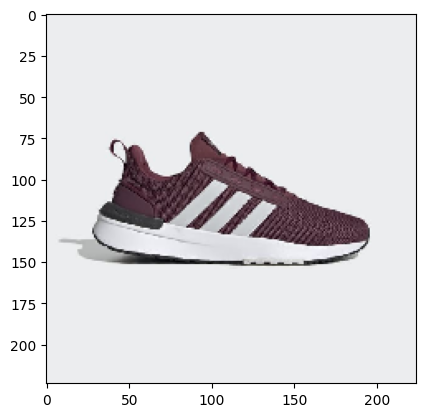

name:  datathon/racer_tr21_shoes
rating:  0.9681914966983899


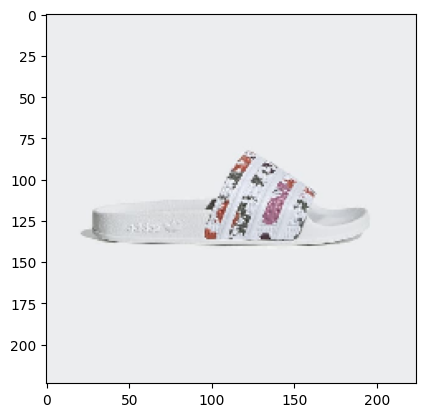

name:  datathon/adilette_slides
rating:  0.9680744881706437


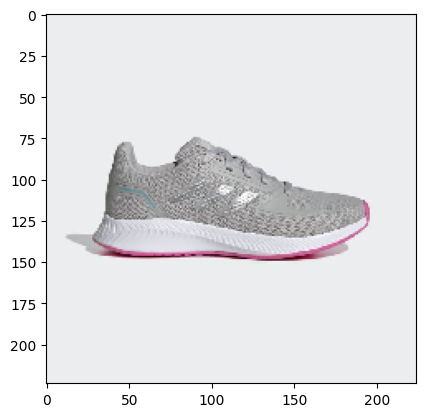

name:  datathon/runfalcon_2.0_shoes
rating:  0.9678027312915266


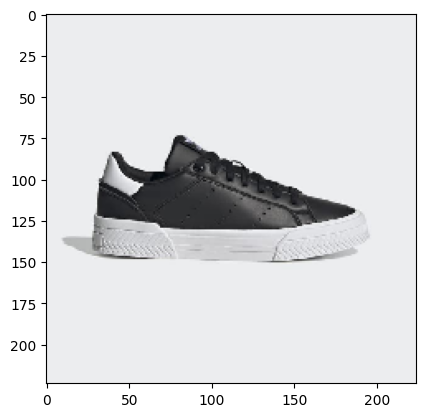

name:  datathon/court_tourino_shoes
rating:  0.9677748648092263


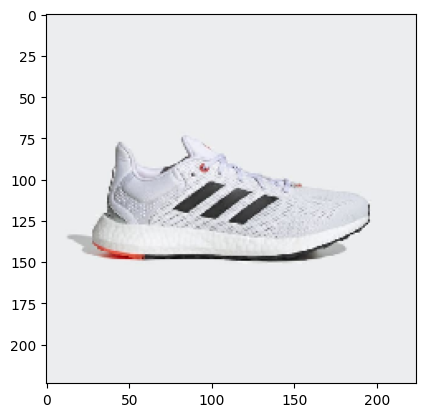

name:  datathon/pureboost_21_shoes
rating:  0.9674854976430967


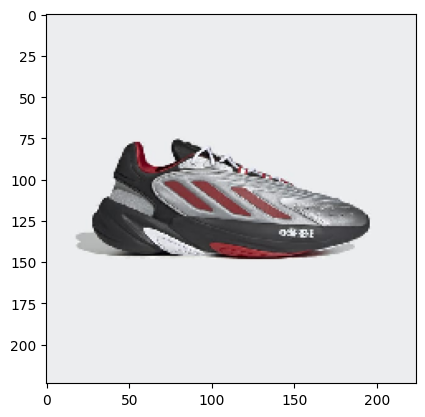

name:  datathon/ozelia_shoes
rating:  0.9674745747938013


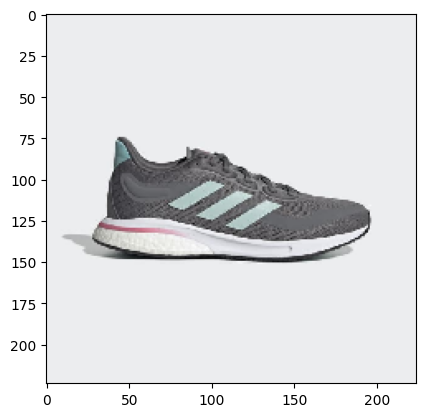

name:  datathon/supernova_shoes
rating:  0.9671139717839459


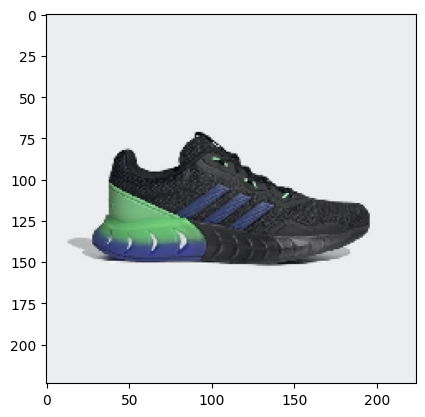

name:  datathon/kaptir_super_shoes
rating:  0.9670216888028409


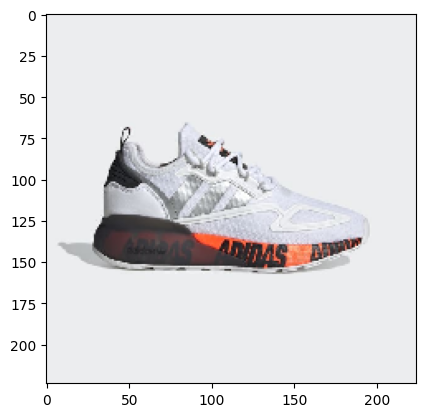

name:  datathon/zx_2k_boost_shoes
rating:  0.9670172897354197


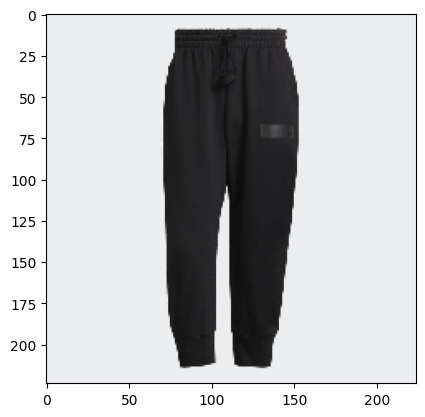

name:  datathon/parley_sweat_pants_(gender_neutral)
rating:  0.9669737948132541


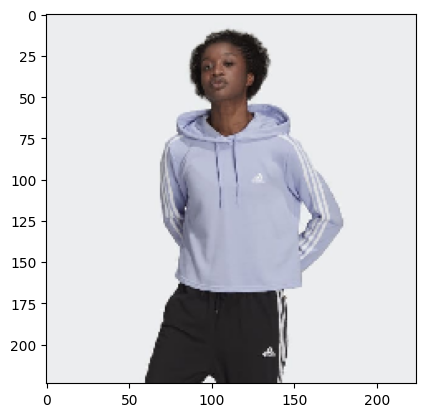

name:  datathon/essentials_3-stripes_cropped_hoodie
rating:  0.9666617533364866


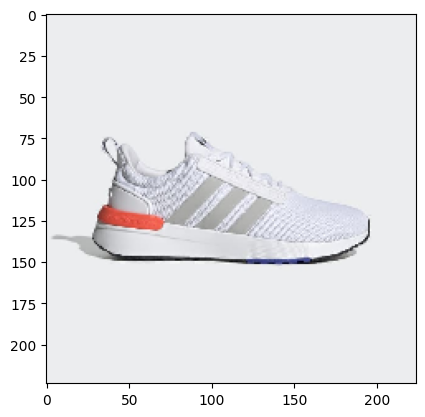

name:  datathon/racer_tr21_wide_shoes
rating:  0.9666569187400607


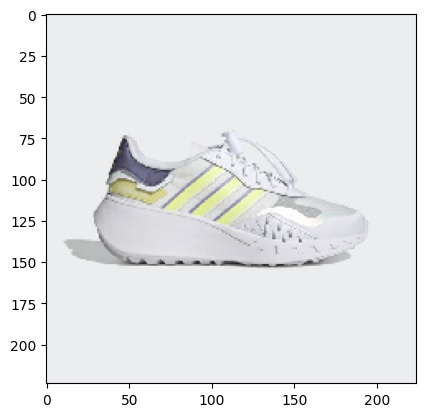

name:  datathon/choigo_shoes
rating:  0.9665712231094906


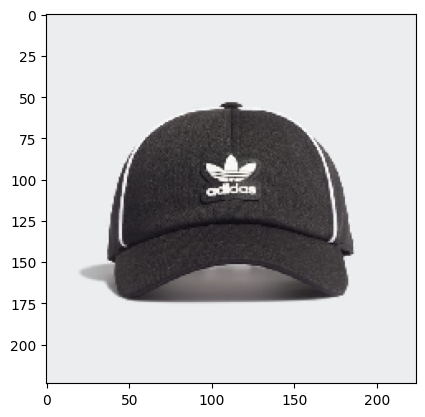

name:  datathon/adicolor_collegiate_baseball_cap
rating:  0.9665569657538643


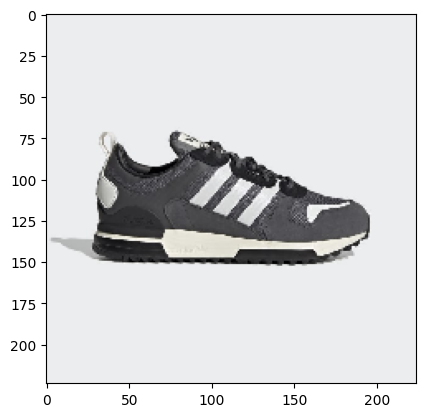

name:  datathon/zx_700_hd_shoes
rating:  0.9665538435827006


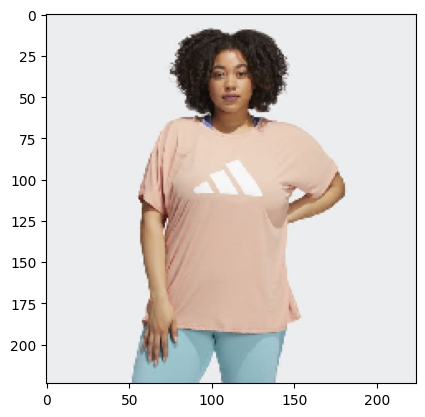

name:  datathon/3-stripes_training_tee_(plus_size)
rating:  0.9665085137761446


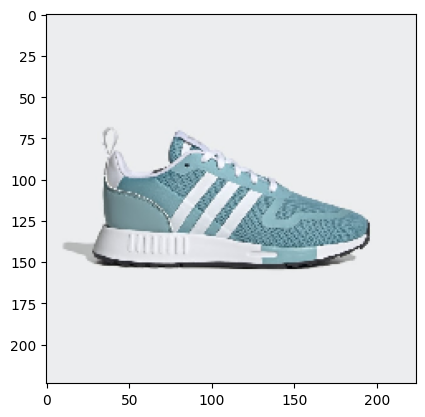

name:  datathon/multix_shoes
rating:  0.9661103226827281


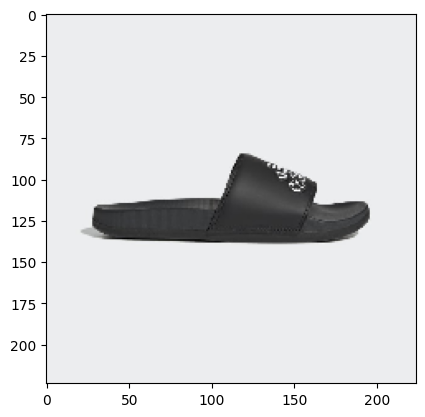

name:  datathon/adilette_comfort_slides
rating:  0.9655560582257245


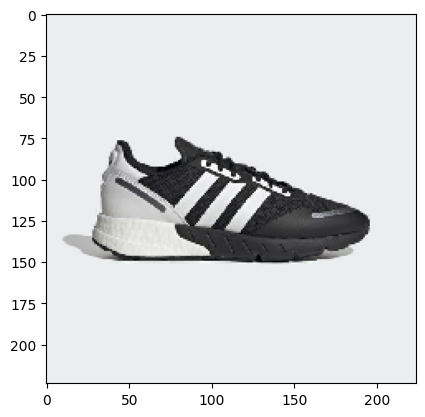

name:  datathon/zx_1k_boost_shoes
rating:  0.965406070187354


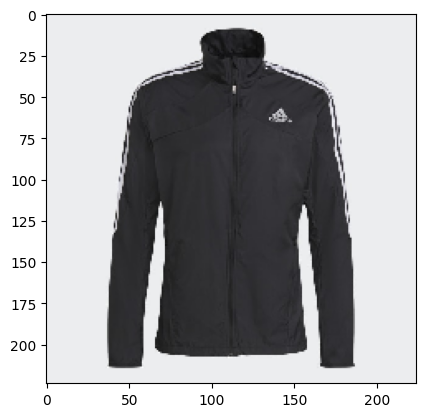

name:  datathon/marathon_3-stripes_jacket
rating:  0.9653614097329146


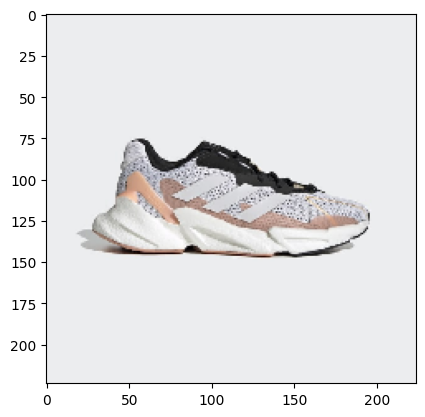

name:  datathon/x9000l4_shoes
rating:  0.9653081507112713


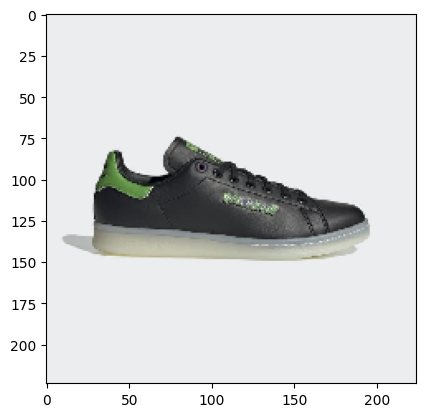

name:  datathon/hulk_stan_smith_shoes
rating:  0.9651133951478152


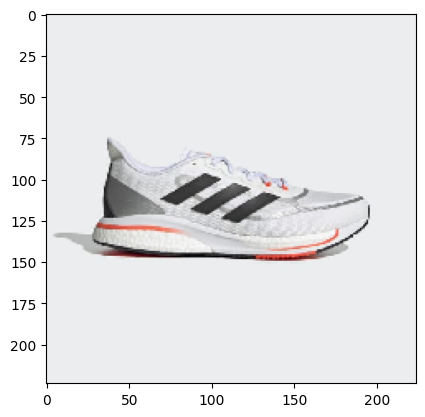

name:  datathon/supernova+_shoes
rating:  0.96494053641236


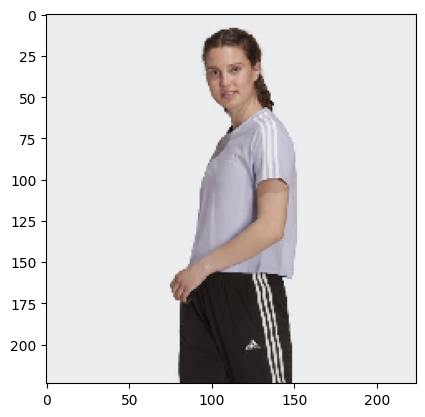

name:  datathon/essentials_loose_3-stripes_cropped_tee
rating:  0.9644407606798563


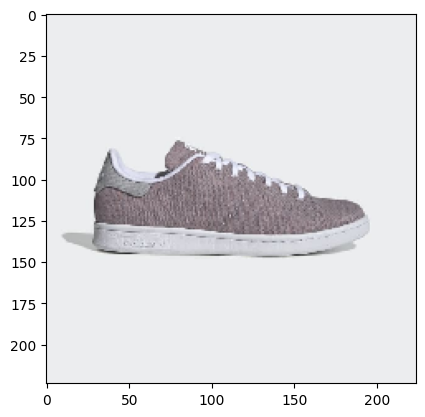

name:  datathon/stan_smith_shoes
rating:  0.9643801166365252


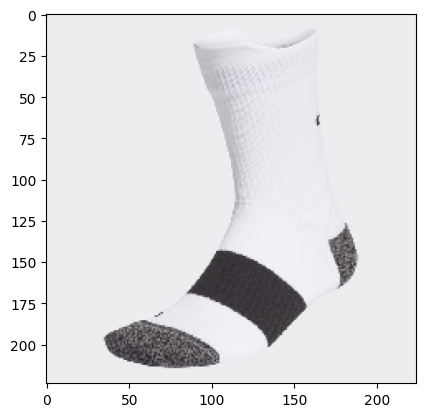

name:  datathon/running_ultralight_crew_performance_socks
rating:  0.9641121161855015


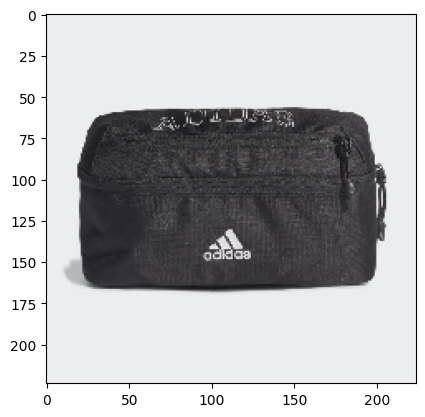

name:  datathon/classic_waist_bag
rating:  0.9641036932189588


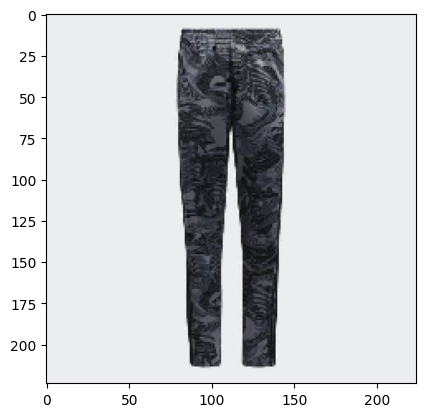

name:  datathon/camo_pants
rating:  0.9640798609872668


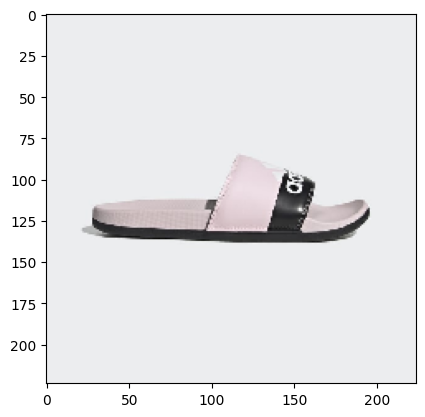

name:  datathon/adilette_comfort_sandals
rating:  0.9639638349224187


In [11]:
i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", vector_cosine[top_indices[i]])
    i+=1
    showed_items.append(name)

## COSINE SIMILARITY + RIDGE REGRESSION

In [12]:
def calculate_cosine(vector1, vector2):
    dot_product = np.dot(vector1, vector2)
    norm_vector1 = np.linalg.norm(vector1)
    norm_vector2 = np.linalg.norm(vector2)

    similarity = dot_product / (norm_vector1 * norm_vector2)

    return similarity

In [13]:
vector_cosine = np.zeros(products.shape[0])
for item in items:
    item_features = np.array(products.loc[item])
    cosine_similarity = []
    for i in range(0, products.shape[0]):
        item_i = np.array(products_features[i,:])
        cosine_similarity.append(calculate_cosine(item_features, item_i))
    cosine_similarity = np.array(cosine_similarity)
    vector_cosine = vector_cosine + cosine_similarity
vector_cosine = vector_cosine/len(items)

/Users/pianokill/miniconda3/envs/datathon/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:200: LinAlgWarning: Ill-conditioned matrix (rcond=3.97376e-08): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


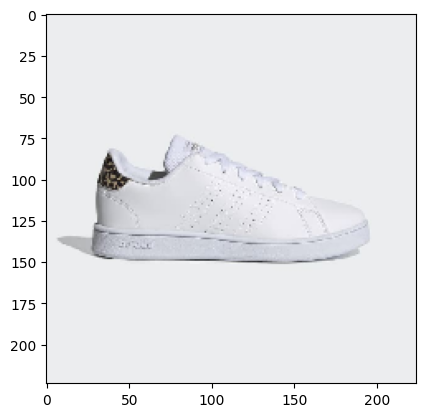

name:  datathon/advantage_shoes
rating:  0.95336694


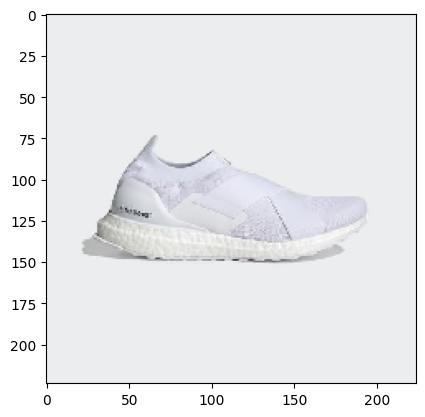

name:  datathon/ultraboost_slip-on_dna_shoes
rating:  0.95299846


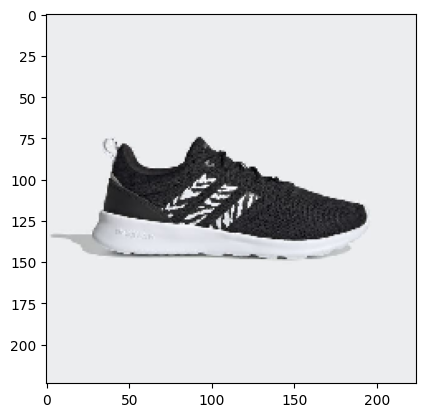

name:  datathon/qt_racer_2.0_shoes
rating:  0.95254964


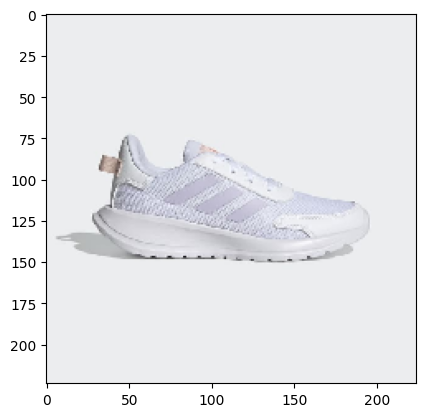

name:  datathon/tensor_run_shoes
rating:  0.9518377


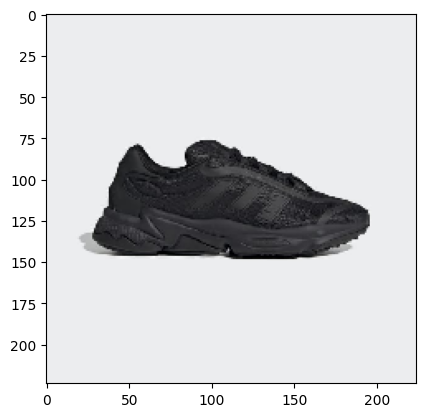

name:  datathon/ozweego_pure_shoes
rating:  0.95167845


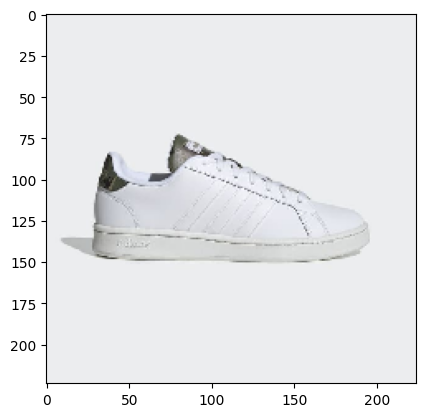

name:  datathon/grand_court_shoes
rating:  0.95122486


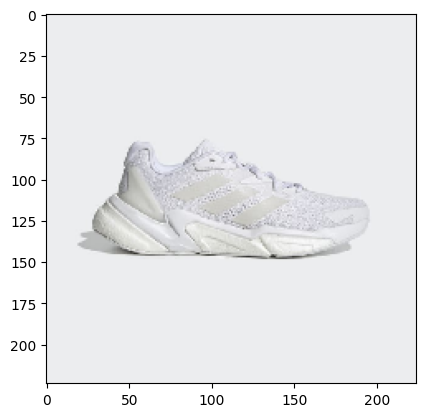

name:  datathon/x9000l3_shoes
rating:  0.95067364


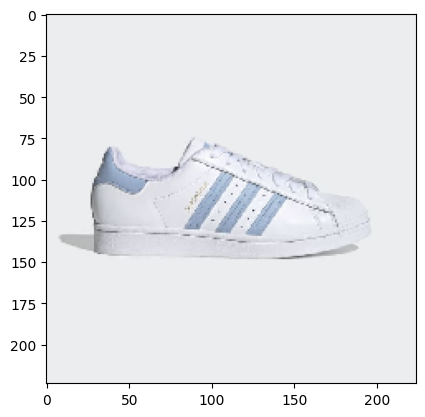

name:  datathon/superstar_shoes
rating:  0.95065516


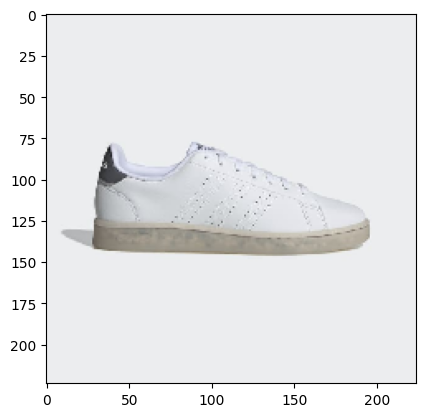

name:  datathon/advantage_eco_shoes
rating:  0.9504687


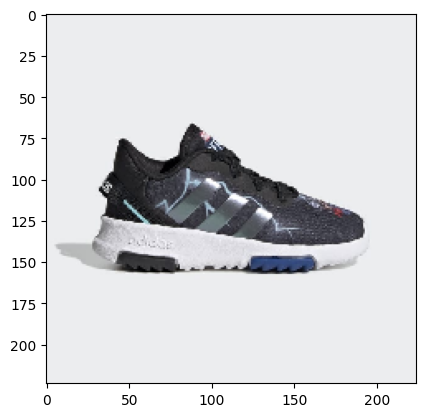

name:  datathon/marvel_superhero_racer_tr_2.0_shoes
rating:  0.950231


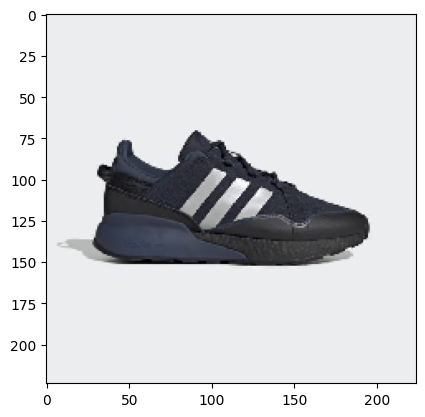

name:  datathon/zx_2k_boost_pure_shoes
rating:  0.9501247


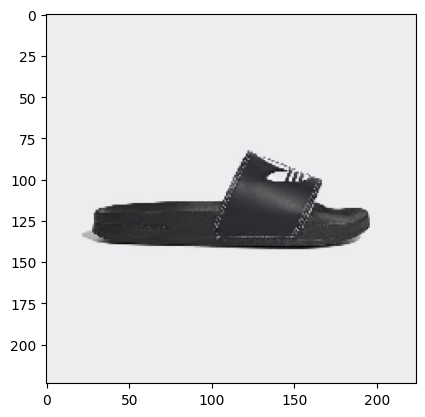

name:  datathon/adilette_lite_slides
rating:  0.949845


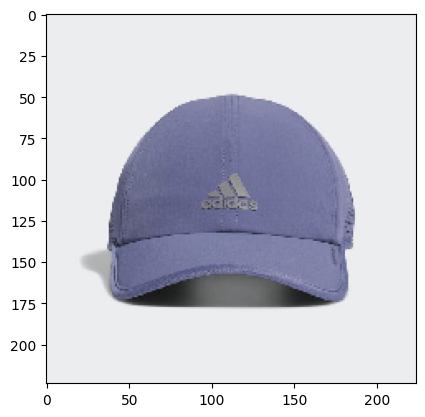

name:  datathon/superlite_hat
rating:  0.94950706


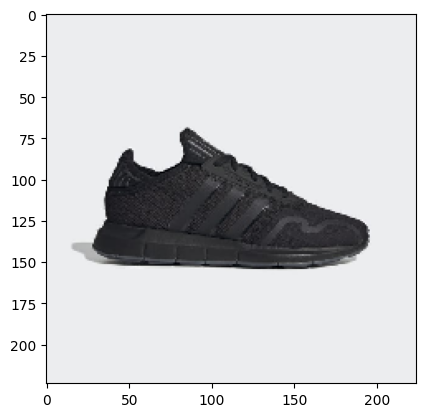

name:  datathon/swift_run_x_shoes
rating:  0.94941336


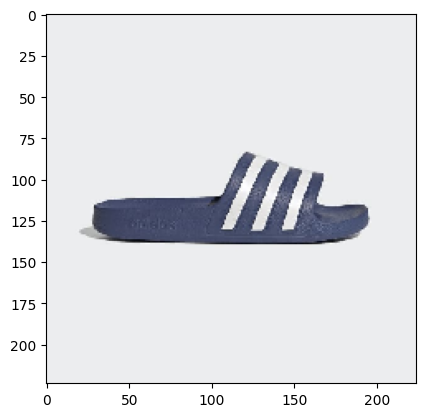

name:  datathon/adilette_aqua_slides
rating:  0.949356


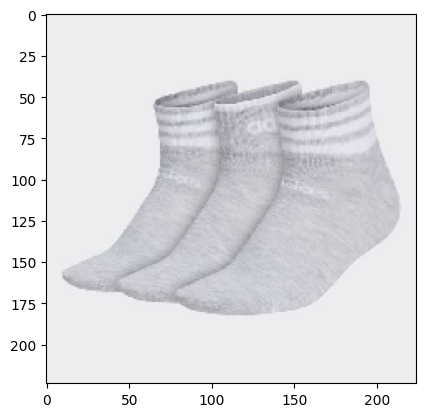

name:  datathon/3-stripes_low_cut_socks_3_pairs
rating:  0.9492217


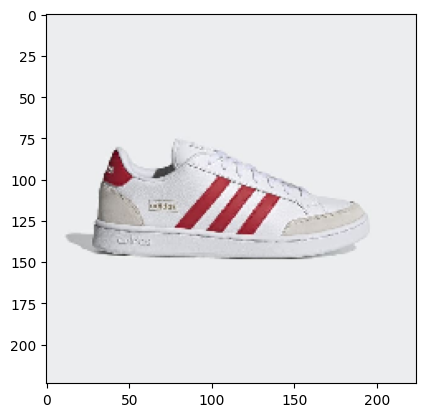

name:  datathon/grand_court_se_shoes
rating:  0.9492158


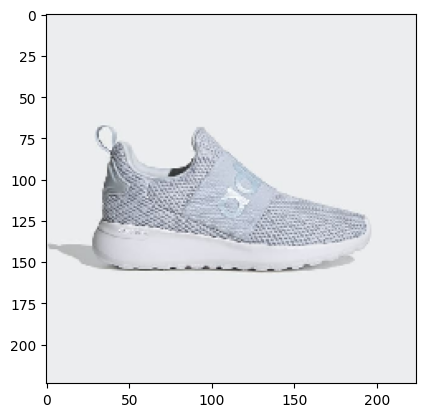

name:  datathon/lite_racer_adapt_4.0_shoes
rating:  0.94909805


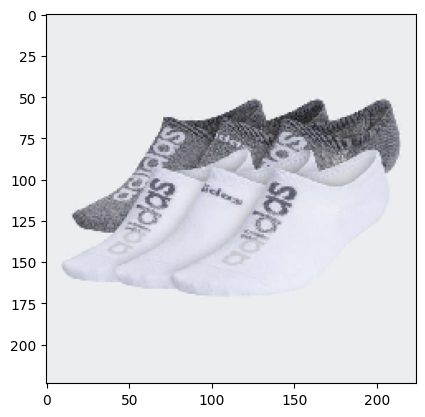

name:  datathon/linear_superlite_super-no-show_socks_6_pairs
rating:  0.9490128


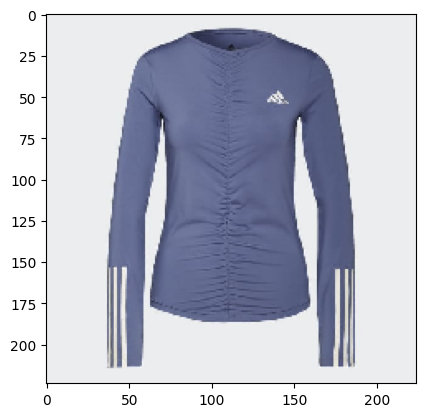

name:  datathon/aeroready_breathable_3-stripes_long_sleeve_tee
rating:  0.94885343


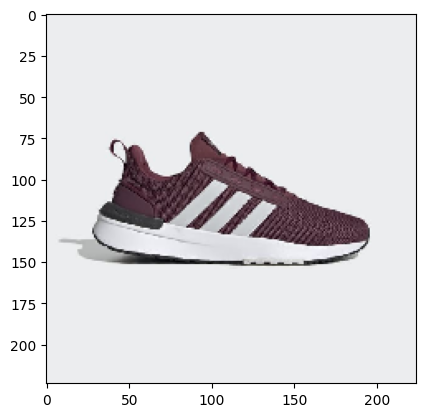

name:  datathon/racer_tr21_shoes
rating:  0.9488098


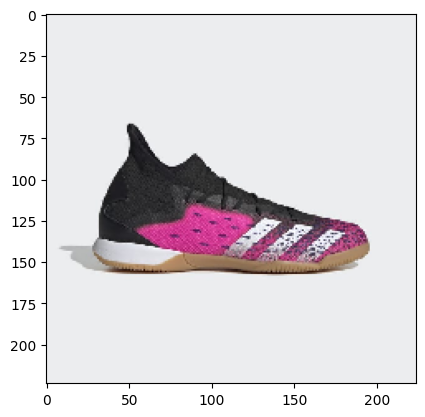

name:  datathon/predator_freak.3_indoor_shoes
rating:  0.9487266


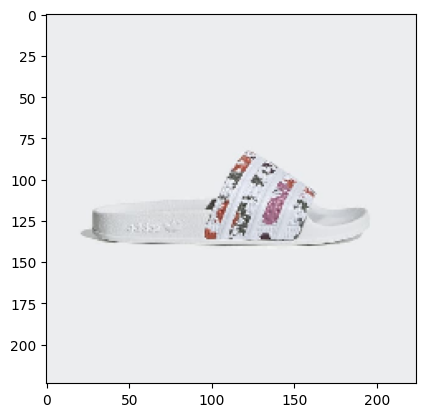

name:  datathon/adilette_slides
rating:  0.9482569


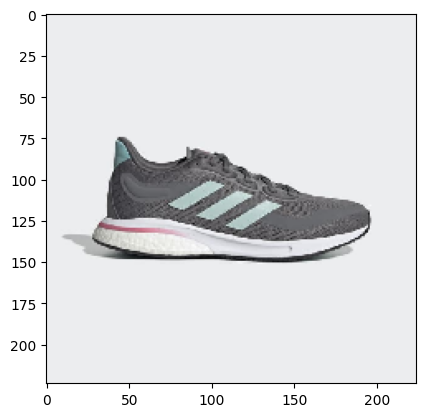

name:  datathon/supernova_shoes
rating:  0.94820255


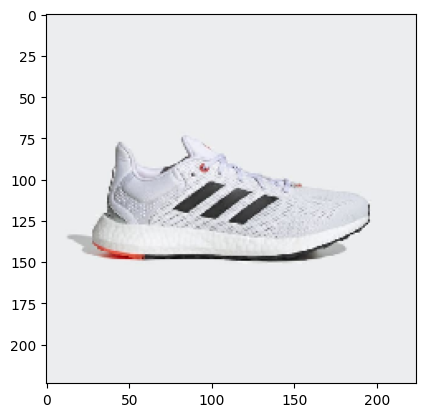

name:  datathon/pureboost_21_shoes
rating:  0.9480855


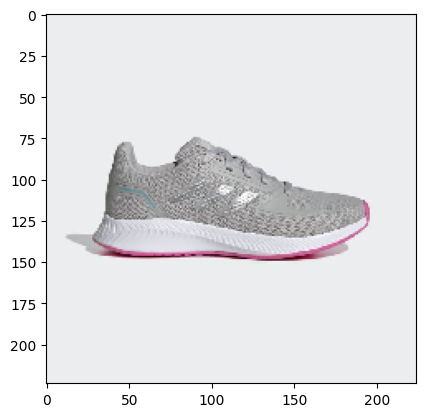

name:  datathon/runfalcon_2.0_shoes
rating:  0.9478436


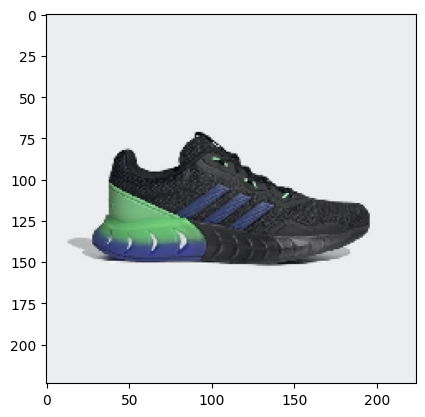

name:  datathon/kaptir_super_shoes
rating:  0.9475202


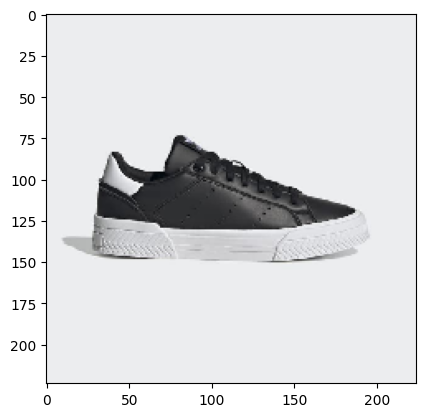

name:  datathon/court_tourino_shoes
rating:  0.94749373


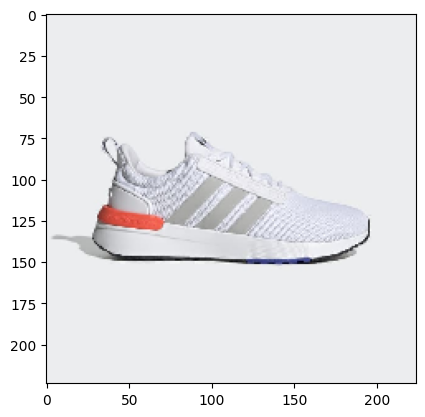

name:  datathon/racer_tr21_wide_shoes
rating:  0.94733745


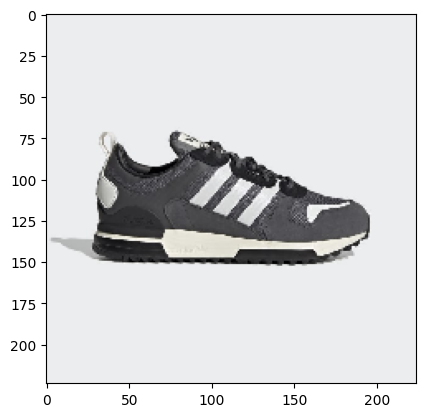

name:  datathon/zx_700_hd_shoes
rating:  0.9472615


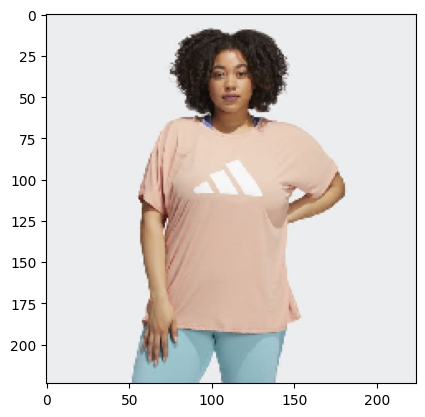

name:  datathon/3-stripes_training_tee_(plus_size)
rating:  0.9470307


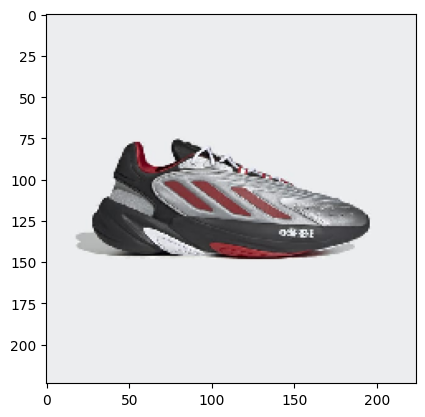

name:  datathon/ozelia_shoes
rating:  0.94692653


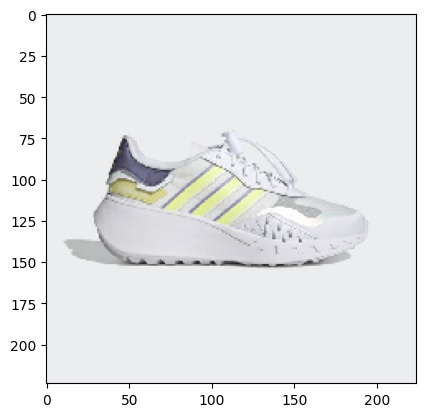

name:  datathon/choigo_shoes
rating:  0.94688386


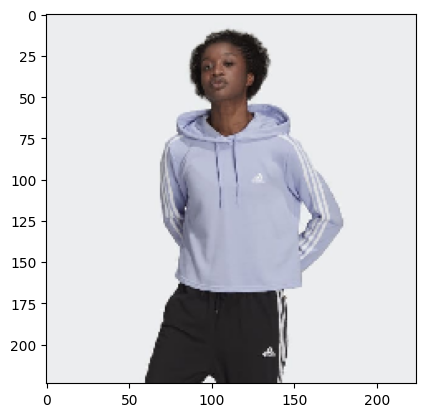

name:  datathon/essentials_3-stripes_cropped_hoodie
rating:  0.9467549


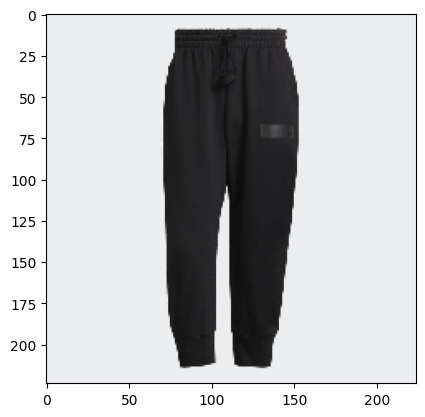

name:  datathon/parley_sweat_pants_(gender_neutral)
rating:  0.94667906


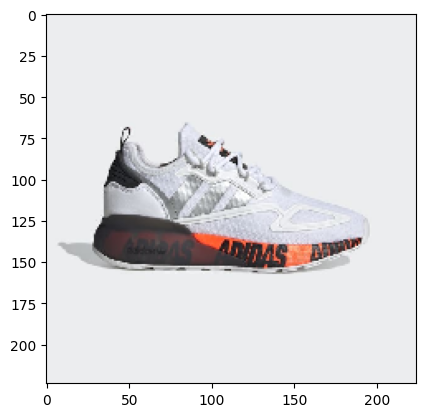

name:  datathon/zx_2k_boost_shoes
rating:  0.94667023


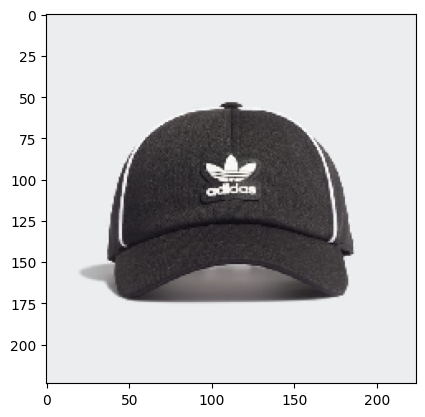

name:  datathon/adicolor_collegiate_baseball_cap
rating:  0.9466223


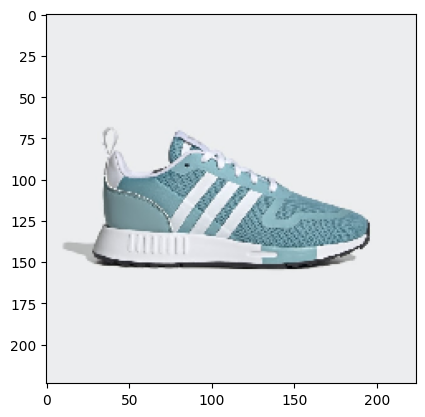

name:  datathon/multix_shoes
rating:  0.9461729


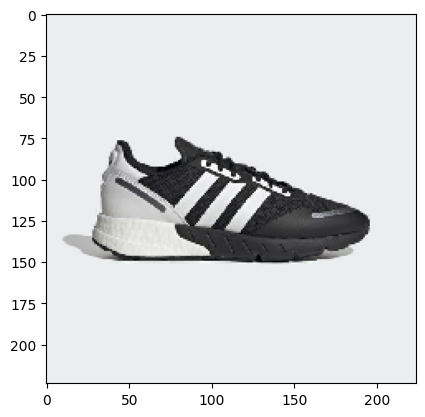

name:  datathon/zx_1k_boost_shoes
rating:  0.94610924


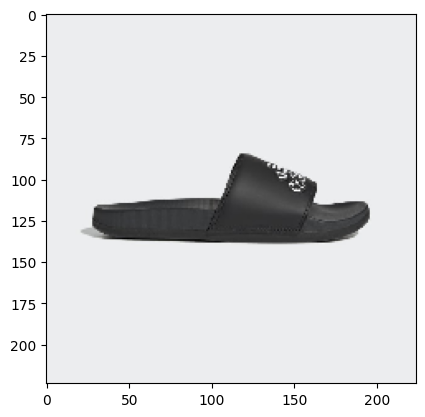

name:  datathon/adilette_comfort_slides
rating:  0.9458179


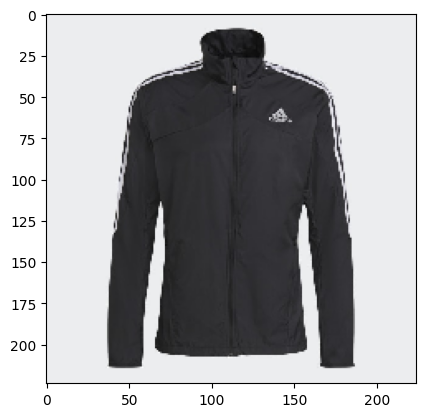

name:  datathon/marathon_3-stripes_jacket
rating:  0.9457249


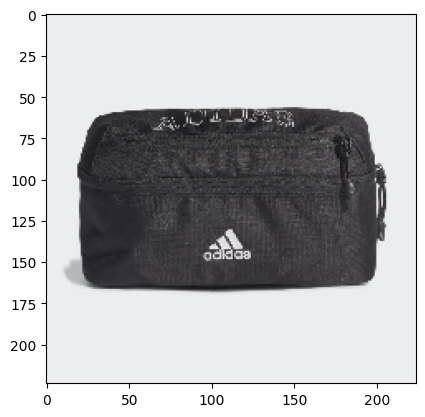

name:  datathon/classic_waist_bag
rating:  0.9452719


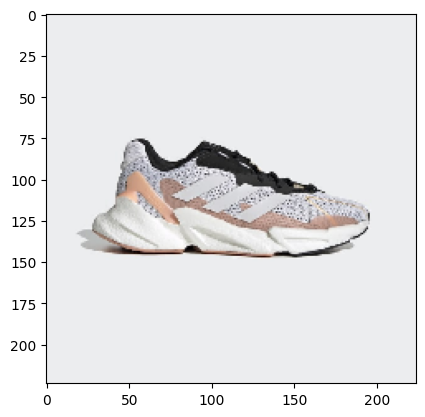

name:  datathon/x9000l4_shoes
rating:  0.94521743


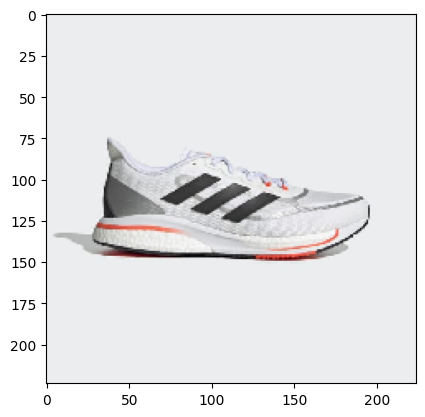

name:  datathon/supernova+_shoes
rating:  0.94511765


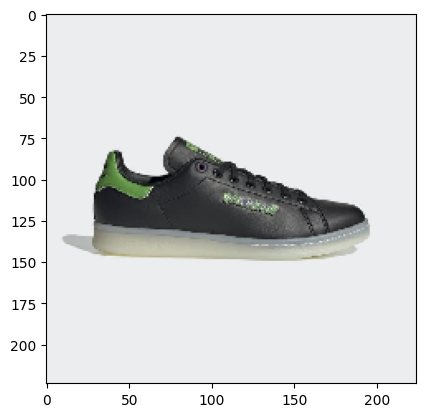

name:  datathon/hulk_stan_smith_shoes
rating:  0.9449529


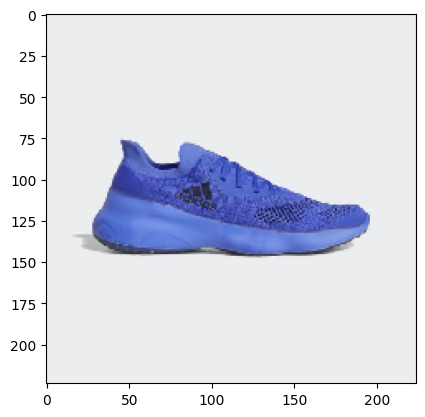

name:  datathon/futurenatural_shoes
rating:  0.9448646


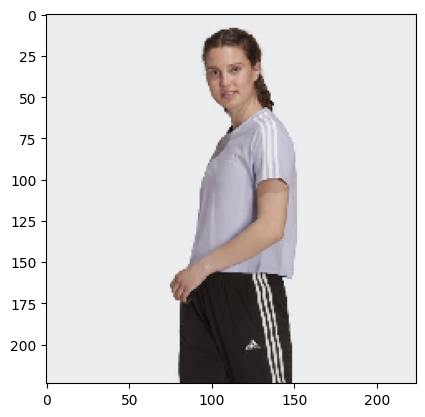

name:  datathon/essentials_loose_3-stripes_cropped_tee
rating:  0.9448026


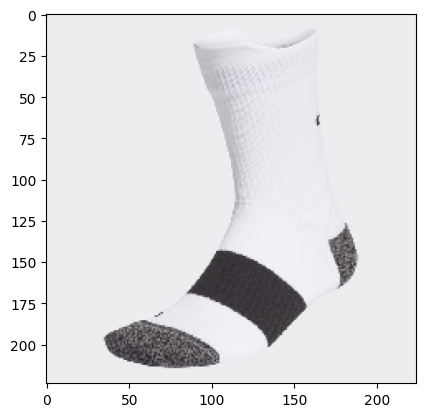

name:  datathon/running_ultralight_crew_performance_socks
rating:  0.94465774


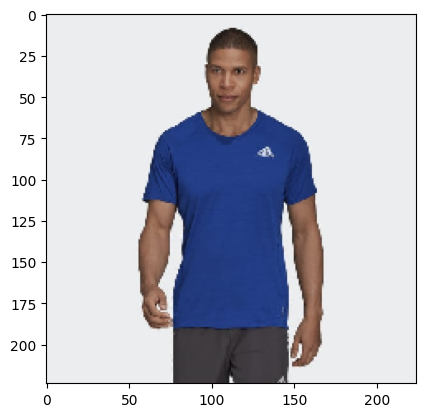

name:  datathon/runner_tee
rating:  0.9445452


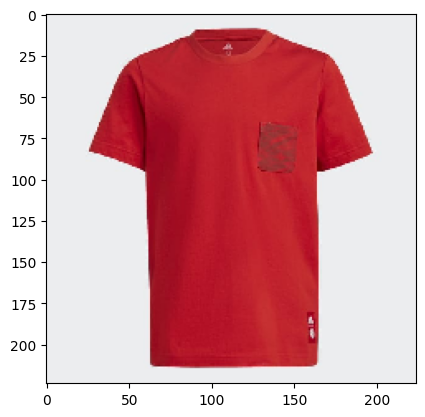

name:  datathon/fc_bayern_tee
rating:  0.9445289


In [14]:
clf = linear_model.Ridge(alpha=0.01, fit_intercept  = True)
clf.fit(products_features, vector_cosine)
w = clf.coef_
b = clf.intercept_
ratings = products_features.dot(w) + b
top_indices = np.argsort(ratings)[::-1]

i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", ratings[top_indices[i]])
    i+=1
    showed_items.append(name)